# Classifiez automatiquement des biens de consommation

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from fuzzywuzzy import fuzz

import cv2
import time
import re
import pickle
from sklearn import cluster, metrics
from matplotlib.image import imread
from sklearn import manifold #TSNE
from matplotlib import offsetbox
from sklearn import preprocessing, decomposition

#img
from PIL import Image

from os import listdir 
import plotly.graph_objects as go
from skimage import io

# Tokenizer
import nltk
from nltk.tokenize import word_tokenize
import nltk.corpus
from nltk.corpus import stopwords
#lematisation et stemmatisation
from nltk.stem.snowball import FrenchStemmer
from nltk.stem import WordNetLemmatizer
import webcolors

#Modèle text
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer # calcule de frequence

import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K
from keras.models import Sequential

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import * #donc Embedding
from tensorflow.keras.models import Model

#Word2vec
import gensim
from gensim.models import Word2Vec

# Bert
import os
from ipywidgets import IntProgress
#import transformers
from transformers import *
os.environ["TF_KERAS"]='1'
import tensorflow_hub as hub
import tensorflow_text 

/home/bdiallo/miniconda3/lib/python3.8/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')
2022-04-25 16:55:19.273131: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/bdiallo/miniconda3/lib/python3.8/site-packages/cv2/../../lib64:
2022-04-25 16:55:19.273152: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [25]:
print(hub.__version__)

0.12.0


In [26]:
link="/home/bdiallo/Documents/OPENCLASSROOM/P6_DIALLO_Fatoumata/"
file= open(link + "df_analyse.csv")
df_analyse = pd.read_csv(file)
data = pd.read_csv(link + "df_etude.csv")

In [27]:
df_analyse

,uniq_id,product_name,product_category_tree,retail_price,discounted_price,image,description,product_rating,product_specifications,target_1,target_2
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,urtains & Accessories
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,aby Bath & Skin
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,aby Bath & Skin
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,ed Linen
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,ed Linen
...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,"{""product_specification""=>[{""key""=>""Number of ...",Baby Care,aby & Kids Gifts
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,"{""product_specification""=>[{""key""=>""Number of ...",Baby Care,aby & Kids Gifts
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,"{""product_specification""=>[{""key""=>""Number of ...",Baby Care,aby & Kids Gifts
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,"{""product_specification""=>[{""key""=>""Number of ...",Baby Care,aby & Kids Gifts


In [28]:
df_etude=data[["target_1","label"]].join(df_analyse[["uniq_id","description"]])

## Preprocessing des données

In [29]:
def token_lemmatize_low(donnee):
    list_color=list(webcolors.CSS3_NAMES_TO_HEX.keys())
    stop_words=stopwords.words('english')
    my_stop_words = text.ENGLISH_STOP_WORDS.union(list_color)
    mot_tokenizer = nltk.RegexpTokenizer(r'\w+') #meilleur sepratation mot et retrait ponctuation ". ,"
    mot_disticint_sansVirgule=mot_tokenizer.tokenize(donnee.lower())

    new_sentence = [c for c in mot_disticint_sansVirgule if c not in stop_words]
    new_sentence_sansColor = [c for c in mot_disticint_sansVirgule if c not in my_stop_words]

    lemmatizer = WordNetLemmatizer()
    lemmatize_sentence = [lemmatizer.lemmatize(w) for w in new_sentence]
    lemmatize_sentence_sansColor = [lemmatizer.lemmatize(w) for w in new_sentence_sansColor]
    
    return  mot_disticint_sansVirgule, new_sentence, lemmatize_sentence, new_sentence_sansColor,\
lemmatize_sentence_sansColor




def preprocessing(donnee, methode, choixLem):
    list_color=list(webcolors.CSS3_NAMES_TO_HEX.keys())
    mot_disticint_sansVirgule, new_sentence, lemmatize_sentence,\
    new_sentence_sansColor,lemmatize_sentence_sansColor=token_lemmatize_low(donnee)
    
    if  methode == "deepLearning":
        preprocessing_text=' '.join(mot_disticint_sansVirgule)
    else:
        if choixLem=="lem":
            preprocessing_text = ' '.join(lemmatize_sentence)
        elif choixLem=="sansNumberLem":
            preprocessing_text = ' '.join(c for c in lemmatize_sentence if not c.isdigit())
        elif choixLem=="sansCouleurLem":
            preprocessing_text = ' '.join(lemmatize_sentence_sansColor) 
        elif choixLem=="sansNumberCouleurLem":
            preprocessing_text = ' '.join(c for c in lemmatize_sentence_sansColor if not c.isdigit())        

        elif choixLem=="bow":
            preprocessing_text = ' '.join(new_sentence)
        elif choixLem=="sansNumberBow":
            preprocessing_text = ' '.join(c for c in new_sentence if not c.isdigit())
        elif choixLem=="sansCouleurBow":
            preprocessing_text = ' '.join(new_sentence_sansColor)                                         
        elif choixLem=="sansNumberCouleurBow":
            preprocessing_text = ' '.join(c for c in new_sentence_sansColor if not c.isdigit())
                                          
    return preprocessing_text
    

In [30]:
##rajout des varaibles en lien avec description
#bag of words
list_variable=['bow', 'sansNumberBow', 'sansCouleurBow', 'sansNumberCouleurBow',
               'lem', 'sansNumberLem', 'sansCouleurLem', 'sansNumberCouleurLem']

for var in list_variable:
    df_etude.loc[:,'description_'+var]= df_etude['description'].apply(lambda x : preprocessing(x, "bow", var))

#deep learning
df_etude.loc[:,'description_deeplearning'] = df_etude['description'].apply(lambda x : preprocessing(x,"deepLearning"," "))
df_etude.shape

(1050, 13)

In [31]:
df_etude

,target_1,label,uniq_id,description,description_bow,description_sansNumberBow,description_sansCouleurBow,description_sansNumberCouleurBow,description_lem,description_sansNumberLem,description_sansCouleurLem,description_sansNumberCouleurLem,description_deeplearning
0,Home Furnishing,4,55b85ea15a1536d46b7190ad6fff8ce7,Key Features of Elegance Polyester Multicolor ...,key features elegance polyester multicolor abs...,key features elegance polyester multicolor abs...,key features elegance polyester multicolor abs...,key features elegance polyester multicolor abs...,key feature elegance polyester multicolor abst...,key feature elegance polyester multicolor abst...,key feature elegance polyester multicolor abst...,key feature elegance polyester multicolor abst...,key features of elegance polyester multicolor ...
1,Baby Care,0,7b72c92c2f6c40268628ec5f14c6d590,Specifications of Sathiyas Cotton Bath Towel (...,specifications sathiyas cotton bath towel 3 ba...,specifications sathiyas cotton bath towel bath...,specifications sathiyas cotton bath towel 3 ba...,specifications sathiyas cotton bath towel bath...,specification sathiyas cotton bath towel 3 bat...,specification sathiyas cotton bath towel bath ...,specification sathiyas cotton bath towel 3 bat...,specification sathiyas cotton bath towel bath ...,specifications of sathiyas cotton bath towel 3...
2,Baby Care,0,64d5d4a258243731dc7bbb1eef49ad74,Key Features of Eurospa Cotton Terry Face Towe...,key features eurospa cotton terry face towel s...,key features eurospa cotton terry face towel s...,key features eurospa cotton terry face towel s...,key features eurospa cotton terry face towel s...,key feature eurospa cotton terry face towel se...,key feature eurospa cotton terry face towel se...,key feature eurospa cotton terry face towel se...,key feature eurospa cotton terry face towel se...,key features of eurospa cotton terry face towe...
3,Home Furnishing,4,d4684dcdc759dd9cdf41504698d737d8,Key Features of SANTOSH ROYAL FASHION Cotton P...,key features santosh royal fashion cotton prin...,key features santosh royal fashion cotton prin...,key features santosh royal fashion cotton prin...,key features santosh royal fashion cotton prin...,key feature santosh royal fashion cotton print...,key feature santosh royal fashion cotton print...,key feature santosh royal fashion cotton print...,key feature santosh royal fashion cotton print...,key features of santosh royal fashion cotton p...
4,Home Furnishing,4,6325b6870c54cd47be6ebfbffa620ec7,Key Features of Jaipur Print Cotton Floral Kin...,key features jaipur print cotton floral king s...,key features jaipur print cotton floral king s...,key features jaipur print cotton floral king s...,key features jaipur print cotton floral king s...,key feature jaipur print cotton floral king si...,key feature jaipur print cotton floral king si...,key feature jaipur print cotton floral king si...,key feature jaipur print cotton floral king si...,key features of jaipur print cotton floral kin...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,Baby Care,0,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...
1046,Baby Care,0,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker (Pack o...,wallmantra large vinyl sticker sticker pack 1 ...,wallmantra large vinyl sticker sticker pack pr...,wallmantra large vinyl sticker sticker pack 1 ...,wallmantra large vinyl sticker sticker pack pr...,wallmantra large vinyl sticker sticker pack 1 ...,wallmantra large vinyl sti

In [32]:
#identification des longueurs
list_variable.append("deeplearning")
for i in list_variable:
    df_etude.loc[:,'length_'+i] = df_etude['description_'+i].apply(lambda x : len(word_tokenize(x)))
    print("max length {} est: {}".format(i,df_etude['length_'+i].max()))



cible=df_etude['target_1'].unique().tolist()
nombre_cible=len(cible)
label_categorie=df_etude['label']
df_etude

max length bow est: 383
max length sansNumberBow est: 369
max length sansCouleurBow est: 359
max length sansNumberCouleurBow est: 345
max length lem est: 383
max length sansNumberLem est: 369
max length sansCouleurLem est: 359
max length sansNumberCouleurLem est: 345
max length deeplearning est: 584


,target_1,label,uniq_id,description,description_bow,description_sansNumberBow,description_sansCouleurBow,description_sansNumberCouleurBow,description_lem,description_sansNumberLem,...,description_deeplearning,length_bow,length_sansNumberBow,length_sansCouleurBow,length_sansNumberCouleurBow,length_lem,length_sansNumberLem,length_sansCouleurLem,length_sansNumberCouleurLem,length_deeplearning
0,Home Furnishing,4,55b85ea15a1536d46b7190ad6fff8ce7,Key Features of Elegance Polyester Multicolor ...,key features elegance polyester multicolor abs...,key features elegance polyester multicolor abs...,key features elegance polyester multicolor abs...,key features elegance polyester multicolor abs...,key feature elegance polyester multicolor abst...,key feature elegance polyester multicolor abst...,...,key features of elegance polyester multicolor ...,162,152,155,145,162,152,155,145,236
1,Baby Care,0,7b72c92c2f6c40268628ec5f14c6d590,Specifications of Sathiyas Cotton Bath Towel (...,specifications sathiyas cotton bath towel 3 ba...,specifications sathiyas cotton bath towel bath...,specifications sathiyas cotton bath towel 3 ba...,specifications sathiyas cotton bath towel bath...,specification sathiyas cotton bath towel 3 bat...,specification sathiyas cotton bath towel bath ...,...,specifications of sathiyas cotton bath towel 3...,68,62,61,55,68,62,61,55,74
2,Baby Care,0,64d5d4a258243731dc7bbb1eef49ad74,Key Features of Eurospa Cotton Terry Face Towe...,key features eurospa cotton terry face towel s...,key features eurospa cotton terry face towel s...,key features eurospa cotton terry face towel s...,key features eurospa cotton terry face towel s...,key feature eurospa cotton terry face towel se...,key feature eurospa cotton terry face towel se...,...,key features of eurospa cotton terry face towe...,169,152,164,147,169,152,164,147,216
3,Home Furnishing,4,d4684dcdc759dd9cdf41504698d737d8,Key Features of SANTOSH ROYAL FASHION Cotton P...,key features santosh royal fashion cotton prin...,key features santosh royal fashion cotton prin...,key features santosh royal fashion cotton prin...,key features santosh royal fashion cotton prin...,key feature santosh royal fashion cotton print...,key feature santosh royal fashion cotton print...,...,key features of santosh royal fashion cotton p...,133,114,131,112,133,114,131,112,143
4,Home Furnishing,4,6325b6870c54cd47be6ebfbffa620ec7,Key Features of Jaipur Print Cotton Floral Kin...,key features jaipur print cotton floral king s...,key features jaipur print cotton floral king s...,key features jaipur print cotton floral king s...,key features jaipur print cotton floral king s...,key feature jaipur print cotton floral king si...,key feature jaipur print cotton floral king si...,...,key features of jaipur print cotton floral kin...,178,153,172,147,178,153,172,147,213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,Baby Care,0,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,...,oren empower extra large self adhesive sticker...,246,228,232,214,246,228,232,214,429
1046,Baby Care,0,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker (Pack o...,wallmantra large vinyl sticker sticker pack 1 ...,wallmantra large vinyl sticker sticker pack pr...,wallmantra large vinyl sticker sticker pack 1 ...,wallmantra large vinyl sticker sticker pack pr...,wallmantra large vinyl sticker sticker pack 1 ...,wallmantra large vinyl sticker sticker pack pr...,...,wallmantra large vinyl sticker sticker pack of...,159,154,153,148,159,154,153,148,290
1047,Baby Care,0,5912e037d12774bb73a2048f35a00009,Buy Uberlyfe Extra Large Pigmented Polyvinyl 

#  Étude

## 1/fonctions

In [33]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et  clusters
def ARI_fct(features, nombre_cible, label_categorie) :
    time1 = time.time()
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=nombre_cible, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(label_categorie, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# création du bag of words (CountVectorizer et Tf-idf)
def Bag_of_word(df, methode, variable, nombre_cible, label_categorie, cas):
    if cas==1:
            model=methode(stop_words=stop_words, max_df=0.95, min_df=1)
    elif cas==2: # retrait nom  color
        list_color=list(webcolors.CSS3_NAMES_TO_HEX.keys())
        my_stop_words = text.ENGLISH_STOP_WORDS.union(list_color)
        model=methode(stop_words=my_stop_words, ngram_range=(1, 1), analyzer=u'word', max_df=0.95, min_df=1)
        
    else:
        list_color=list(webcolors.CSS3_NAMES_TO_HEX.keys())
        my_stop_words = text.ENGLISH_STOP_WORDS.union(list_color)
        model=methode(stop_words=my_stop_words, ngram_range=(1, 2), analyzer=u'word', max_df=0.95, min_df=1)
    features = model.fit_transform(df[variable])
    print(methode)
    print("--------")
    ARI, X_tsne, label_cluster = ARI_fct(features, nombre_cible, label_categorie)
    
    return ARI, X_tsne, label_cluster

In [34]:
# graphique Tsne selon a) les vraies catégories et b) les clusters
def TSNE_visu_fct(ARI, X_tsne, label_cluster, cible, label_categorie, methode, types, cas) :

    cible_reduit=[re.split('and |&', cible[i])[0] for i in range(len(cible))]
    
    fig = plt.figure(constrained_layout=True, figsize=[20,12])
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=label_categorie, cmap='Set1', s=90)
    ax.legend(handles=scatter.legend_elements()[0], labels=cible_reduit,
              bbox_to_anchor=(1, 1), loc="upper left", prop={"size": 20},
              title="Categories")
    ax.set_xlabel('tsne1', fontsize = 26, fontweight = 'bold')
    ax.set_ylabel('tsne2', fontsize = 26, fontweight = 'bold')
    plt.title('Analyse des descriptions  par catégories réelles', fontsize=21,
              pad=10, fontweight="bold")
    #xtickslabel=range(X_tsne[:,0].astype(int).min(), X_tsne[:,0].astype(int).max(), 20)
    #ytickslabel=sorted(X_tsne[:,1].astype(int))
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=label_cluster, cmap='Set1', s=90)#, alpha=0.3)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(label_cluster),
              bbox_to_anchor=(1, 1), loc="upper left", prop={"size": 26},
              title="Clusters", fontsize='Large')
    ax.set_xlabel('tsne1', fontsize = 26, fontweight = 'bold')
    ax.set_ylabel('tsne2', fontsize = 26, fontweight = 'bold')
    plt.title("Analyse des description avec TSNE par clusters ", fontsize=21,
              pad=10, fontweight="bold")

    
    plt.rcParams['legend.title_fontsize'] = 24
    plt.rcParams['legend.markerscale'] = 4
    plt.rc("xtick", labelsize=26)
    plt.rc("ytick", labelsize=26)
    
    plt.savefig("fig/Analyse_descritpion_cas"+cas+"_" + methode + i +".png", bbox_inches="tight", format="png")
    plt.show()
    print(methode,"pour", types, "à un ARI : ", ARI)

## 2/ Bag of word (CountVect & Tf-idf)

### b) Word by word avec retrait des noms de couleurs

In [35]:
list_variable.remove("deeplearning")
METHODS={'CountVectorizer': CountVectorizer, "TfidfVectorizer":TfidfVectorizer}
#comme ça avec METHODS.keys tu as les noms de val
TYPES=list_variable
#TYPES_2=['sansCouleurBow', "sansNumberCouleurBow","sansCouleurLem", "sansNumberCouleurLem"]

In [93]:
global str
for val in list(METHODS.keys()):
    for i in TYPES:
        globals()["ARI_"+val+i], globals()["X_tsne_"+val+i], globals()["labels_"+val+i] =\
        Bag_of_word(df_etude, METHODS[val], "description_"+i, nombre_cible, label_categorie,1)

<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.411 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4399 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3574 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3923 time :  9.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4036 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4235 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4109 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4276 time :  6.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI :  0.5755 time :  5.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI :  0.4716 time :  6.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI 

dans le cas 1:
* countvec <br/>
    -Pour Bow sans nombre augmentente l'indice ARI (0.4399) et sans couleur l'abaisse, la combinaison n'est pas meilleure<br/>
    -Pour Lem sans nombre abaisse et sans couleur augmentent l'indice ARI et la combinaison est meilleur (0.4276)<br/>
=> dans le cas de Countvec le prepocessing "tokenize & sansponctuation& stop_word &low & sans nombre" donne le meilleur resultat


* tf-idf <br/>
    -Pour Bow sans nombre abaisse l'indice ARI et sans couleur l'augmente (0.5961), la combinaison n'est pas meilleure <br/>
    -Pour Lem sans nombre abaisse l'indice ARI et et sans couleur  l'augmente (0.5103), la combinaison est meilleur que la valeur depart mais n'est pas optimale<br/>
=> dans le cas de tf-idf  le prepocessing "tokenize & sansponctuation& stop_word &low & sans couleur" donne le meilleur resultat    
  
 <br/>

Des deux methodes c'est tf-idf qui est meilleure

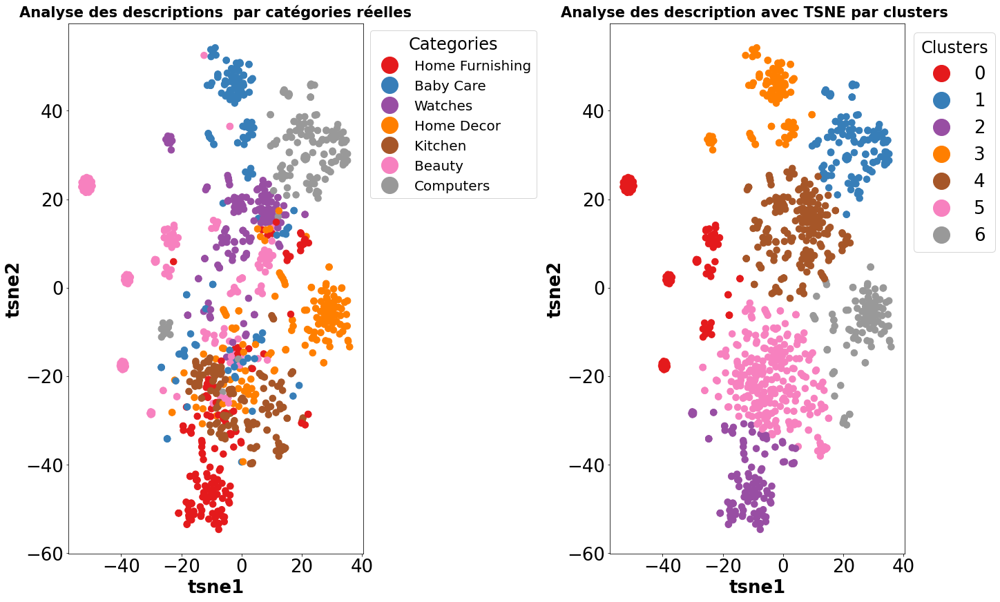

CountVectorizer pour bow à un ARI :  0.411


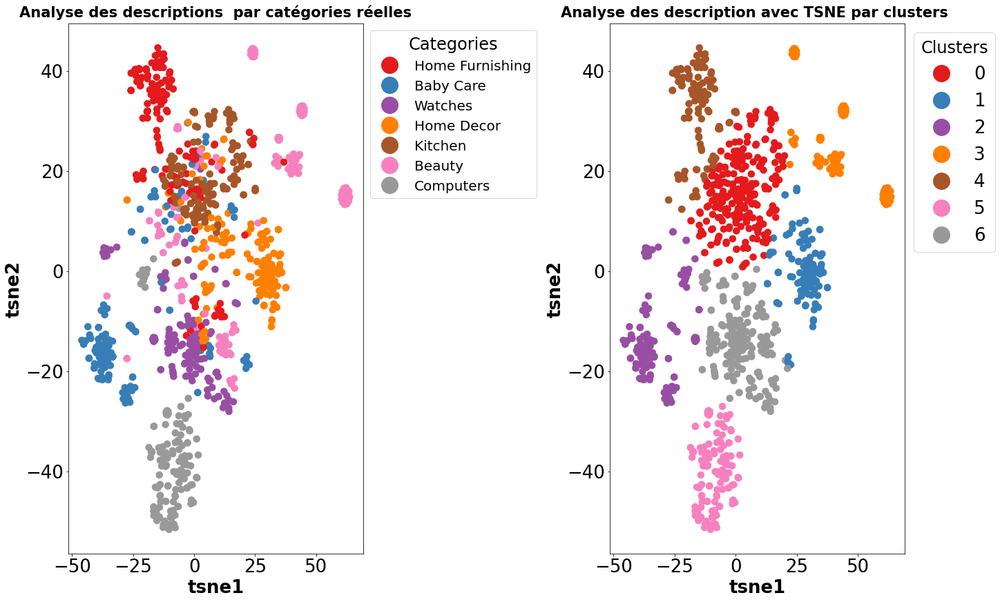

CountVectorizer pour sansNumberBow à un ARI :  0.4399


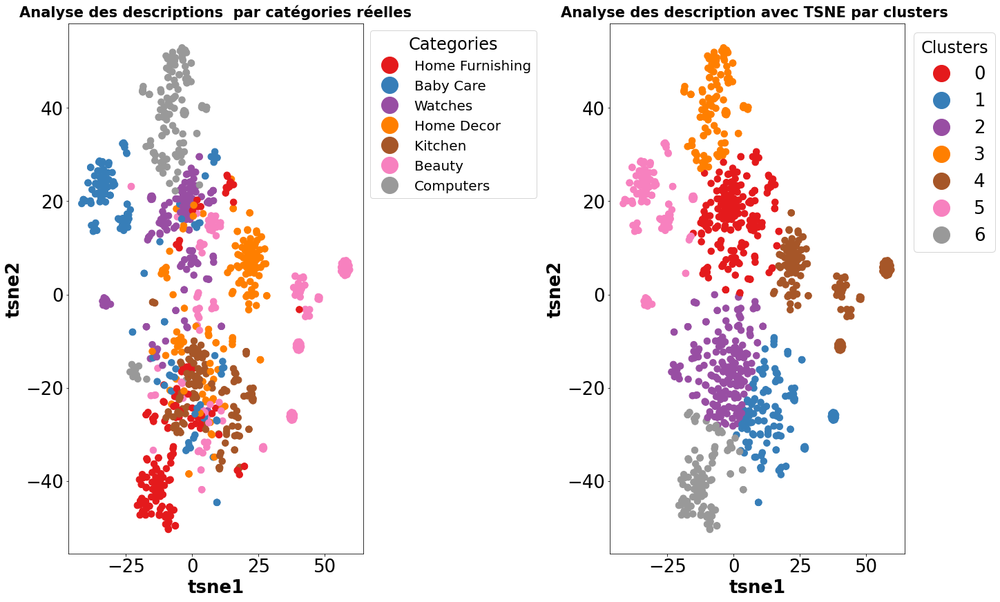

CountVectorizer pour sansCouleurBow à un ARI :  0.3574


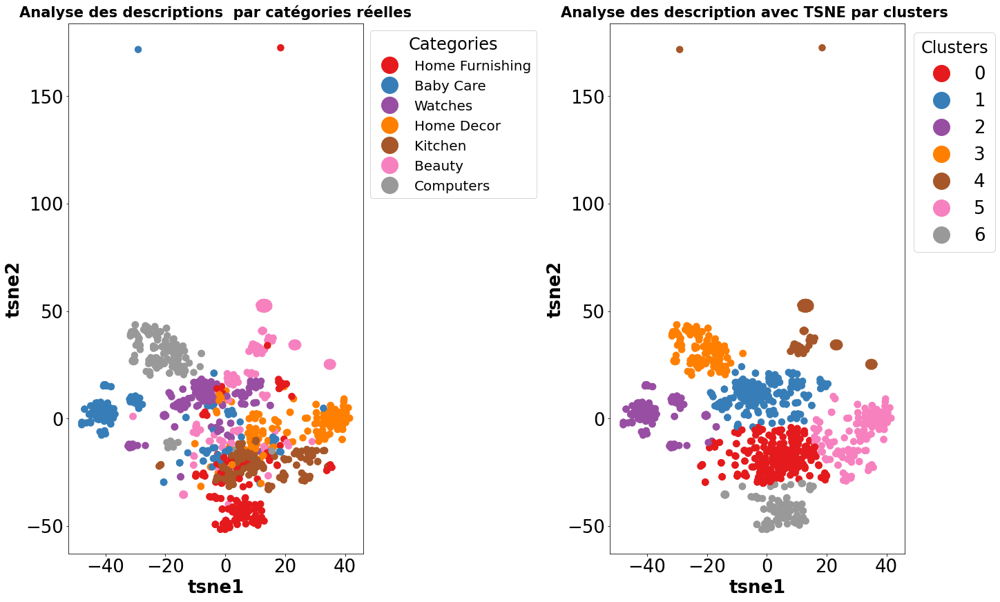

CountVectorizer pour sansNumberCouleurBow à un ARI :  0.3923


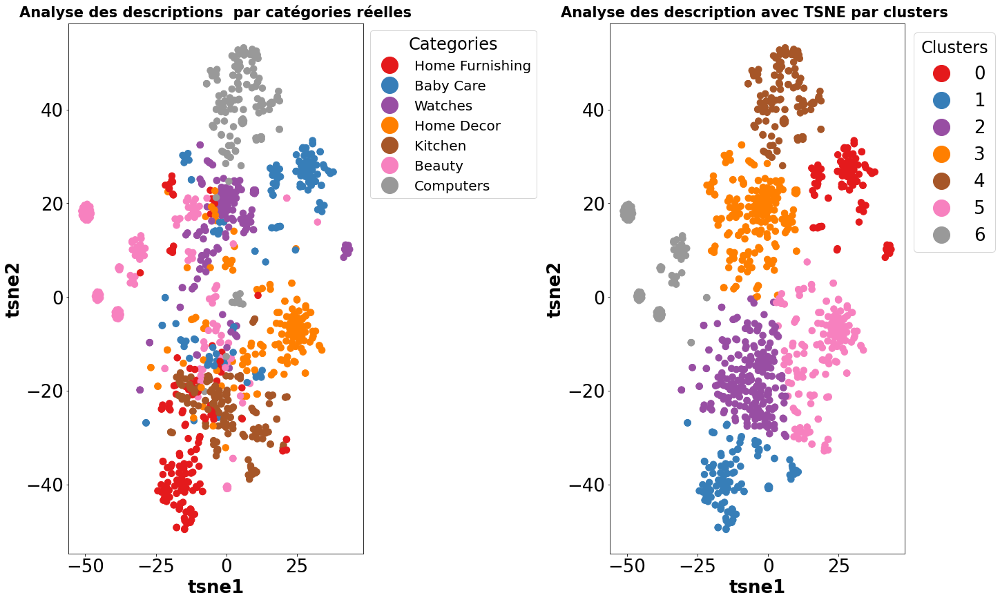

CountVectorizer pour lem à un ARI :  0.4036


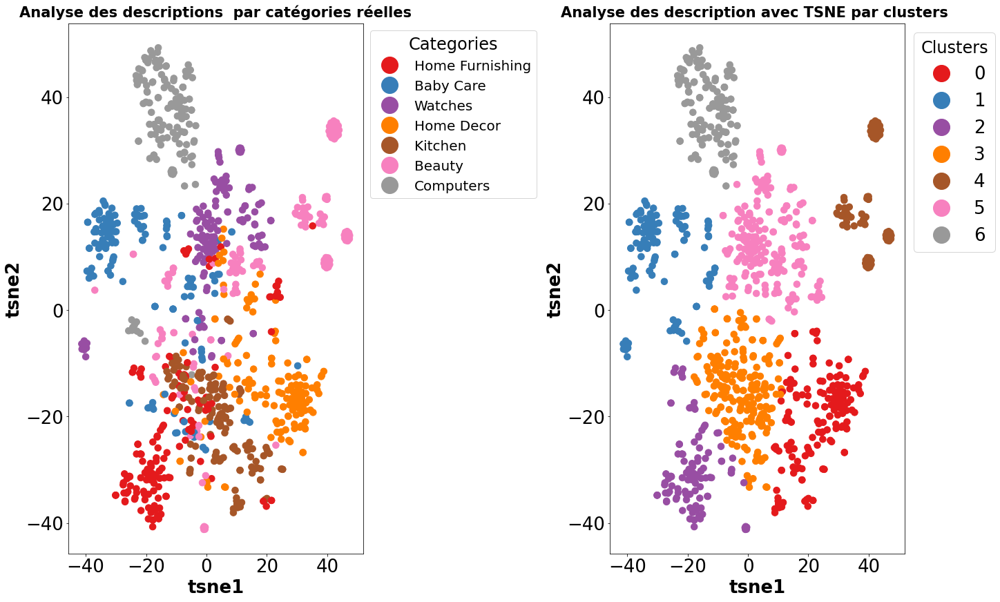

CountVectorizer pour sansNumberLem à un ARI :  0.4235


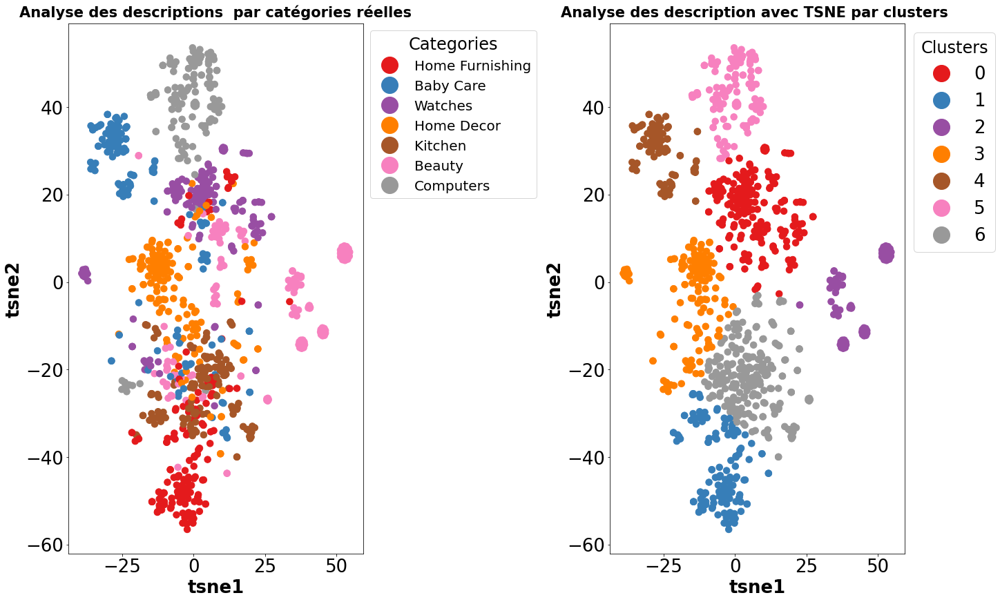

CountVectorizer pour sansCouleurLem à un ARI :  0.4109


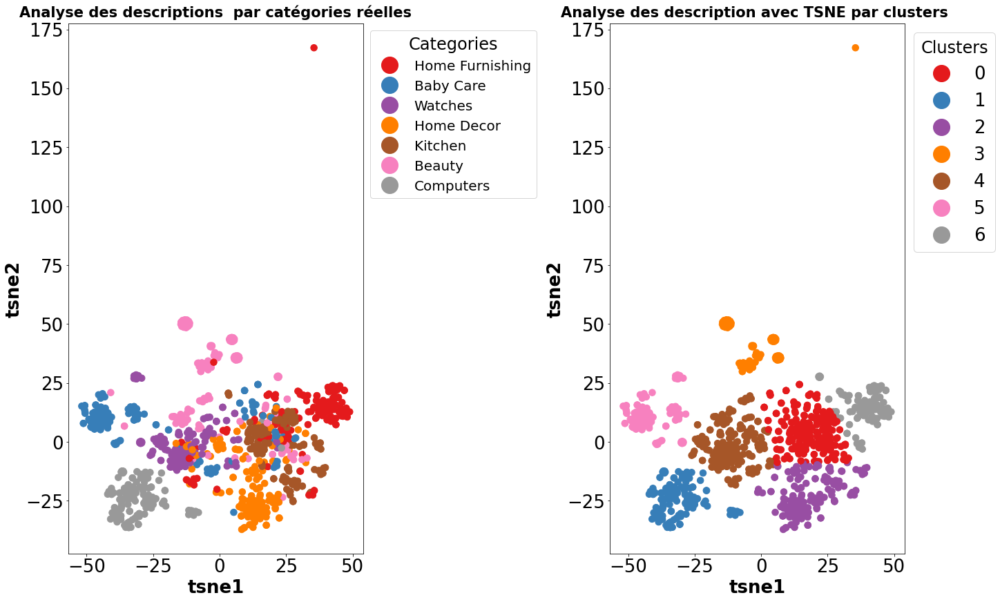

CountVectorizer pour sansNumberCouleurLem à un ARI :  0.4276


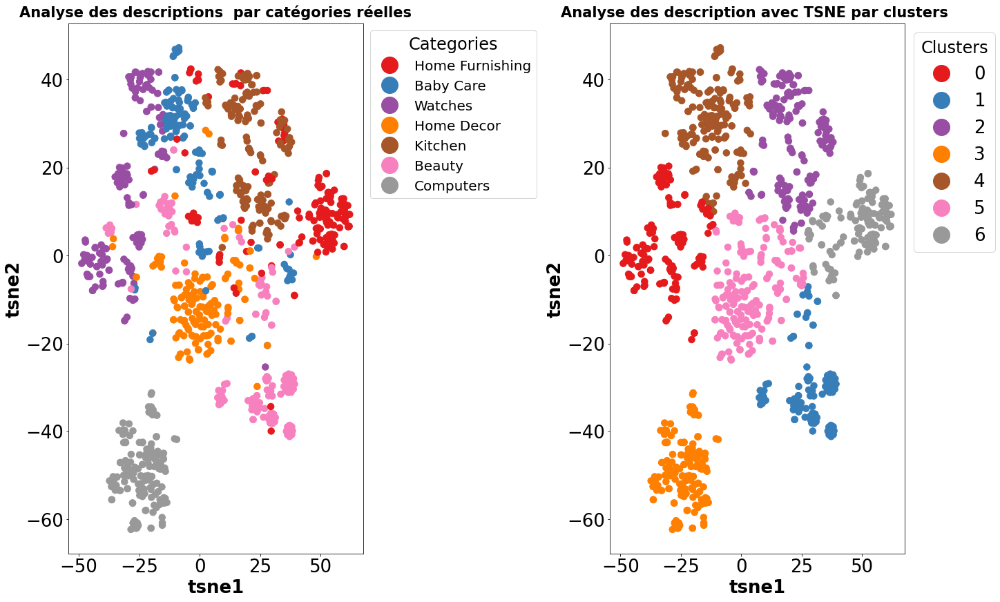

TfidfVectorizer pour bow à un ARI :  0.5755


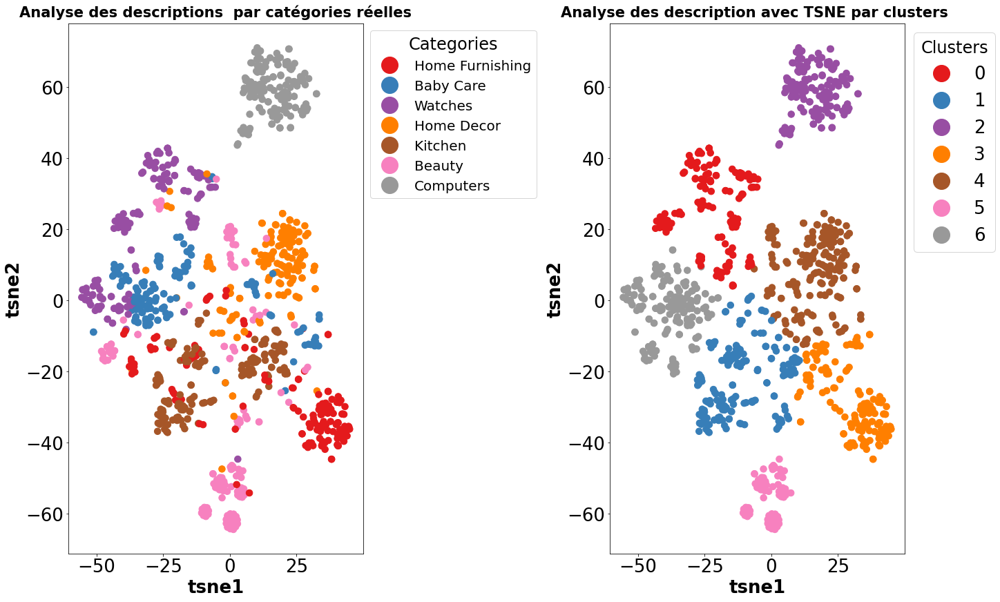

TfidfVectorizer pour sansNumberBow à un ARI :  0.4716


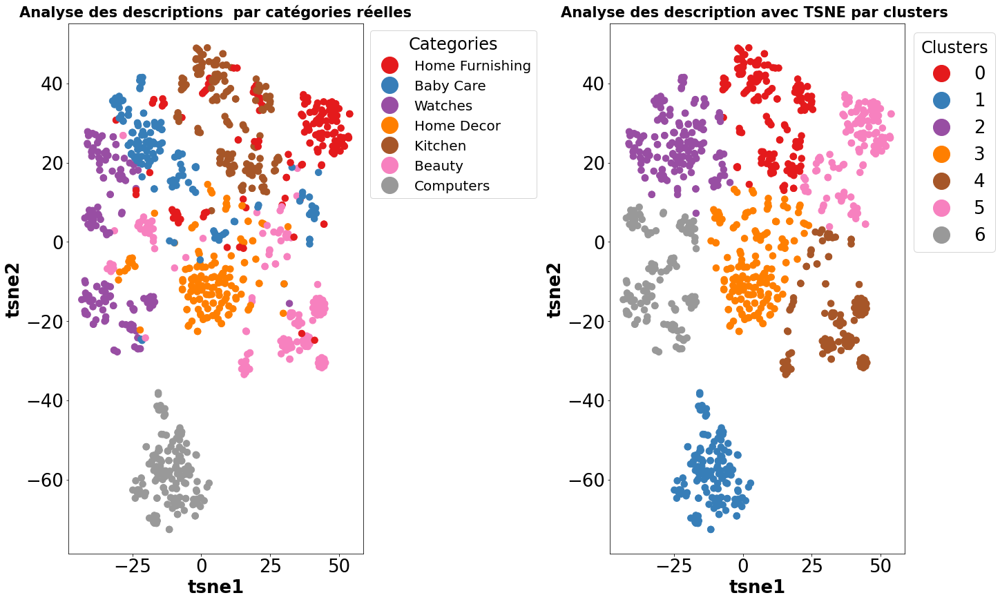

TfidfVectorizer pour sansCouleurBow à un ARI :  0.5961


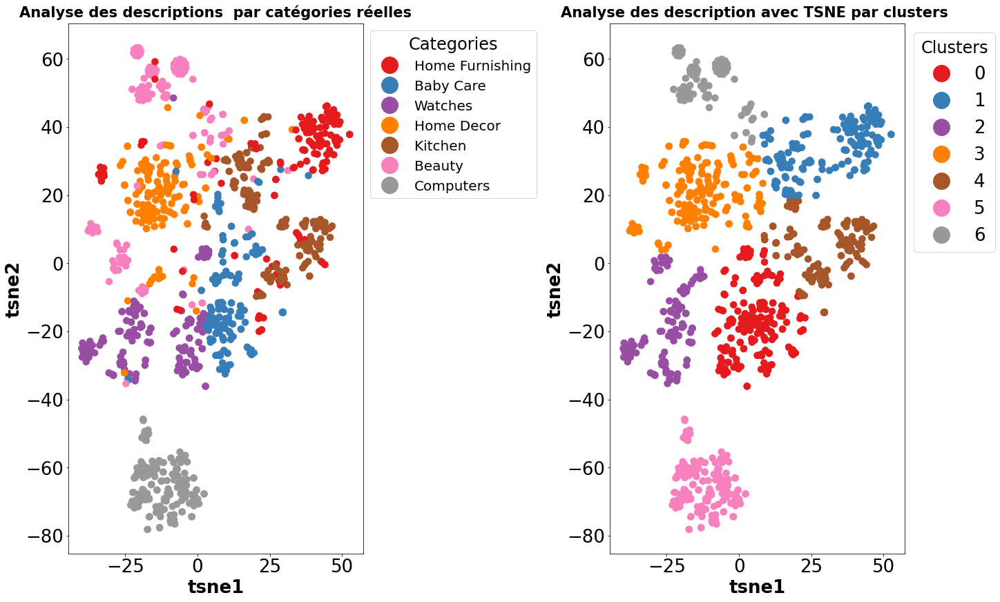

TfidfVectorizer pour sansNumberCouleurBow à un ARI :  0.5097


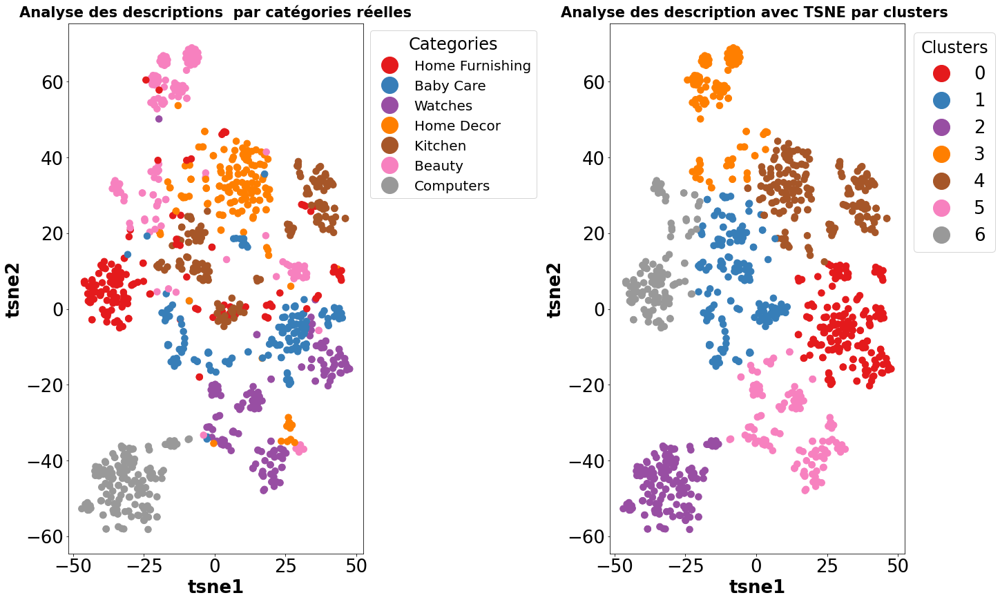

TfidfVectorizer pour lem à un ARI :  0.4386


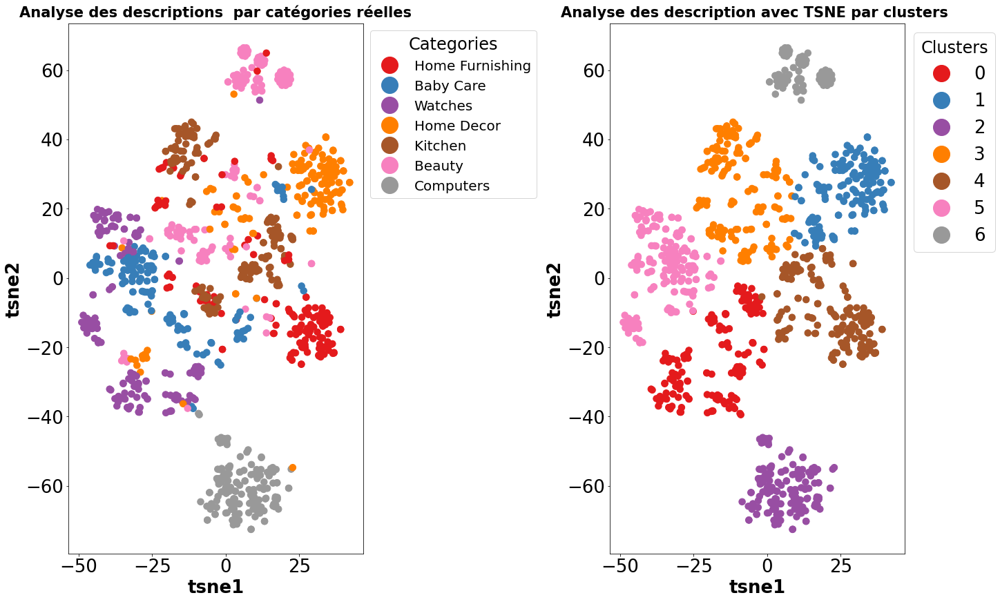

TfidfVectorizer pour sansNumberLem à un ARI :  0.4135


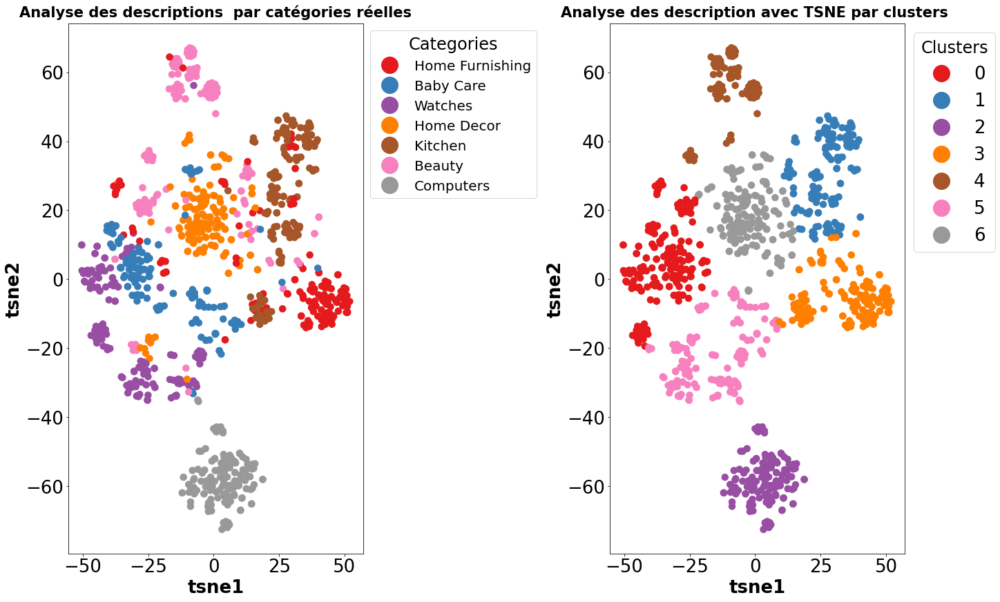

TfidfVectorizer pour sansCouleurLem à un ARI :  0.5103


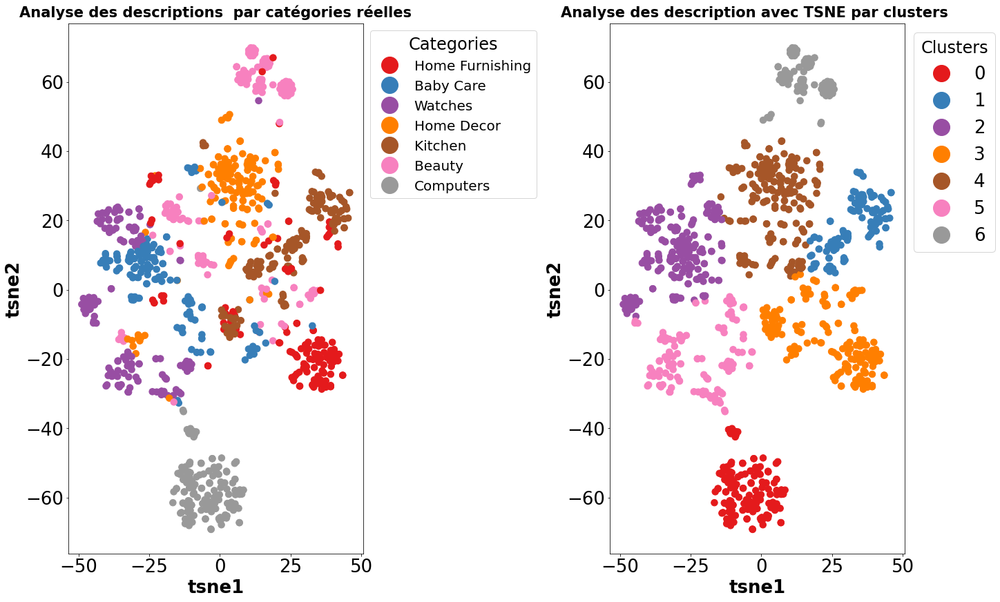

TfidfVectorizer pour sansNumberCouleurLem à un ARI :  0.4622


In [94]:
for val in list(METHODS.keys()):
    for i in TYPES:
        TSNE_visu_fct(globals()["ARI_"+val+i], globals()["X_tsne_"+val+i], globals()["labels_"+val+i], cible, label_categorie, 
                       val, i, "avecColor")

### b)Word by word avec retrait des noms de couleurs

In [95]:
global str

for val in list(METHODS.keys()):
    for i in TYPES:
        globals()["ARI_c_"+val+i], globals()["X_tsne_c_"+val+i], globals()["labels_c_"+val+i] =\
        Bag_of_word(df_etude, METHODS[val], "description_"+i, nombre_cible, label_categorie,2)

<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3574 time :  6.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3923 time :  9.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3736 time :  6.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4071 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4618 time :  6.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4305 time :  7.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4144 time :  6.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.4343 time :  7.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI :  0.5961 time :  6.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI :  0.5097 time :  6.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI

dans le cas 1:
* countvec <br/>
    -Pour Bow sans nombre abaisse et sans couleur augmentent l'indice ARI et la combinaison est meilleur (0.4071) <br/>
    -Pour lem sans nombre et sans couleur abaissent l'indice ARI , la combinaison n'est pas meilleure que la valeur de depart (0.4618) <br/>
=> dans le cas de Countvec le prepocessing "tokenize & sansponctuation& stop_word &low & lemmatisation" donne le meilleur resultat


* tf-idf <br/>
    -Pour Bow  sans nombre et sans couleur abaissent l'indice ARI , la combinaison est moins bonne.La valeur de depart est optimale(0.5961) <br/>
    -Pour Lem  sans nombre et sans couleur abaissent l'indice ARI , la combinaison est moins bonne.La valeur de depart est optimale(0.5196) <br/>
=> dans le cas de tf-idf  le prepocessing "tokenize & sansponctuation& stop_word &low " donne le meilleur resultat    
<br/>

Des deux methode c'est tf-idf qui est meilleure

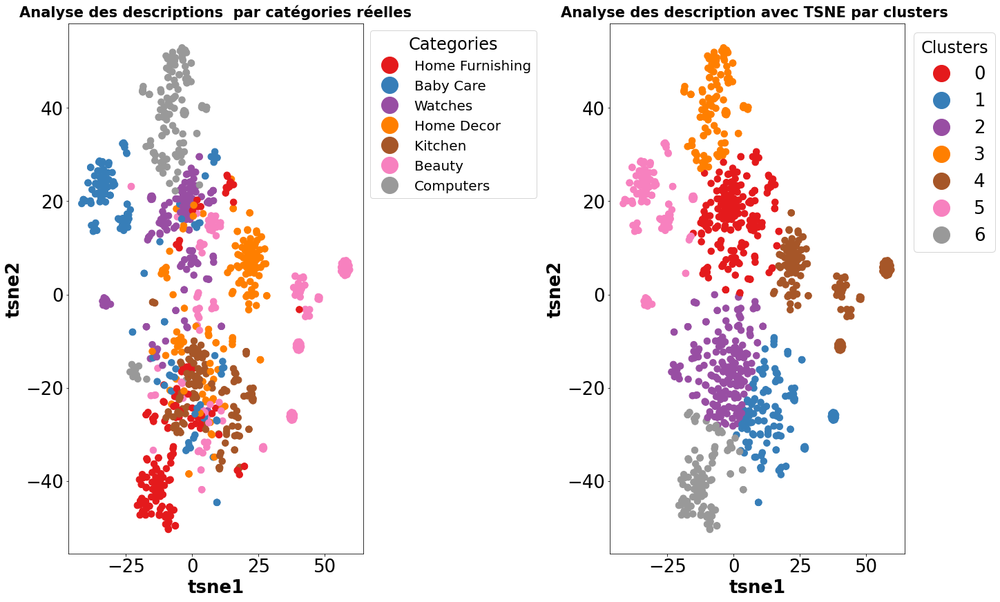

CountVectorizer pour bow à un ARI :  0.3574


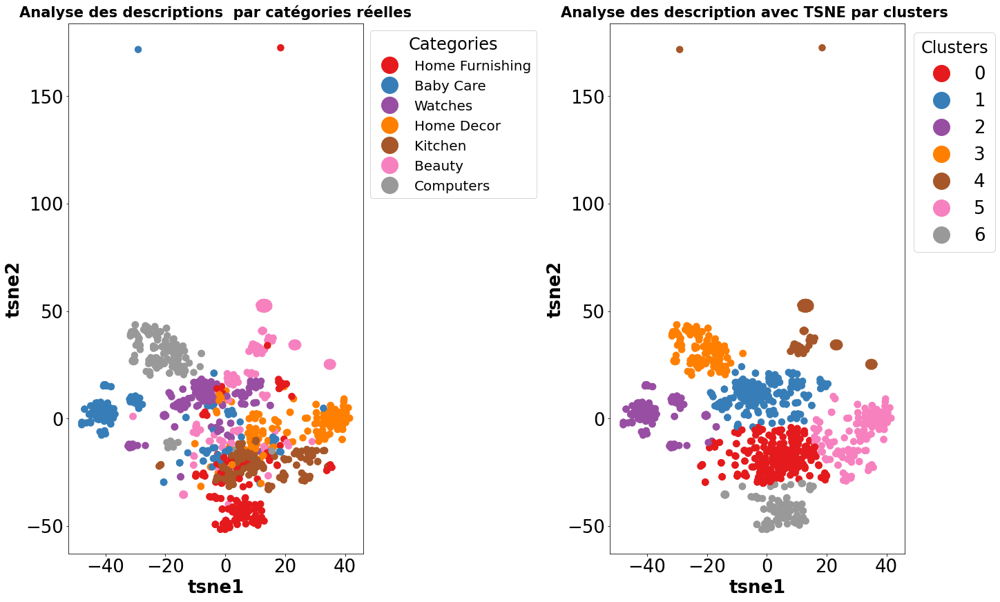

CountVectorizer pour sansNumberBow à un ARI :  0.3923


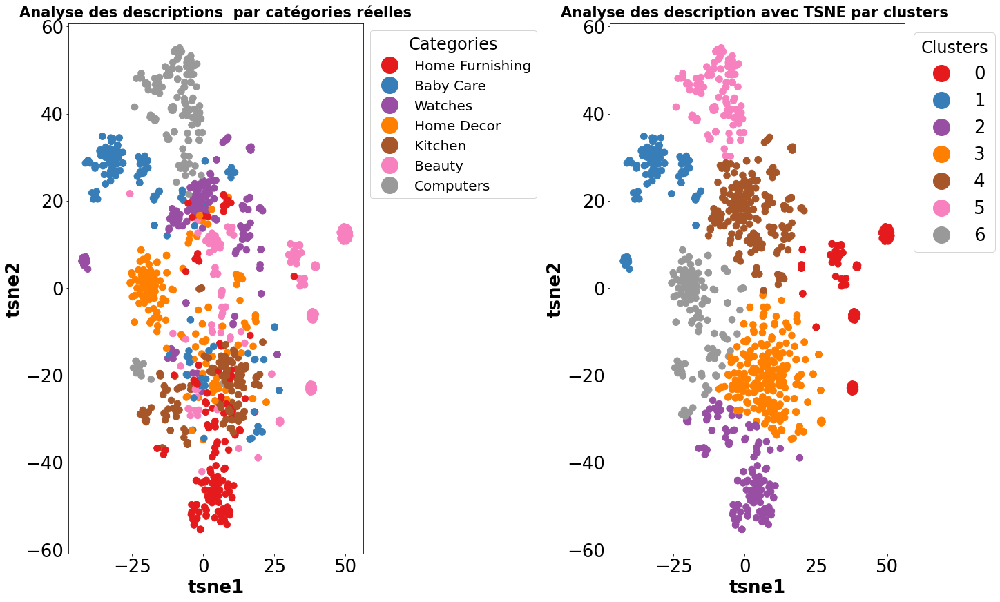

CountVectorizer pour sansCouleurBow à un ARI :  0.3736


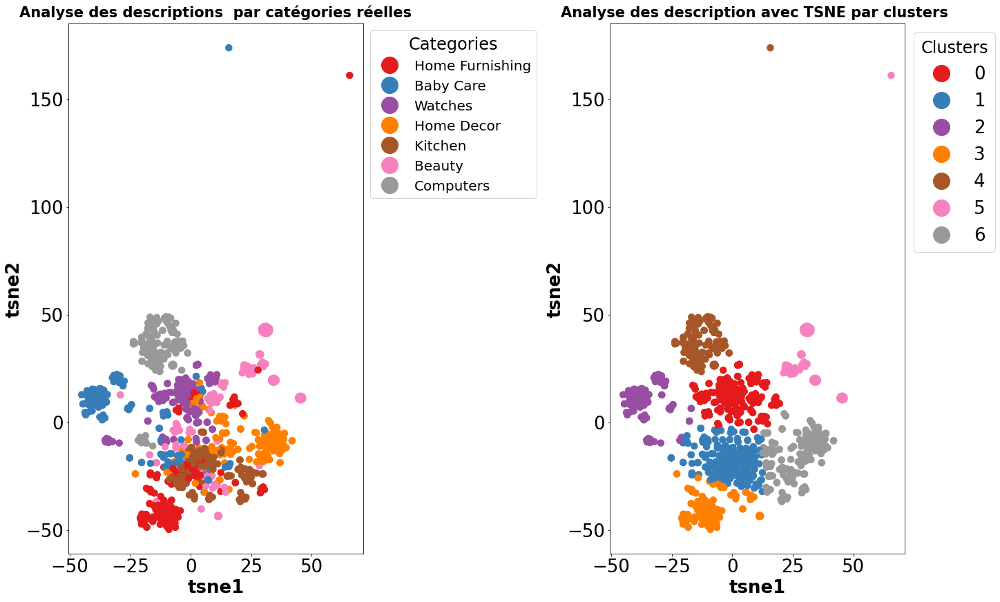

CountVectorizer pour sansNumberCouleurBow à un ARI :  0.4071


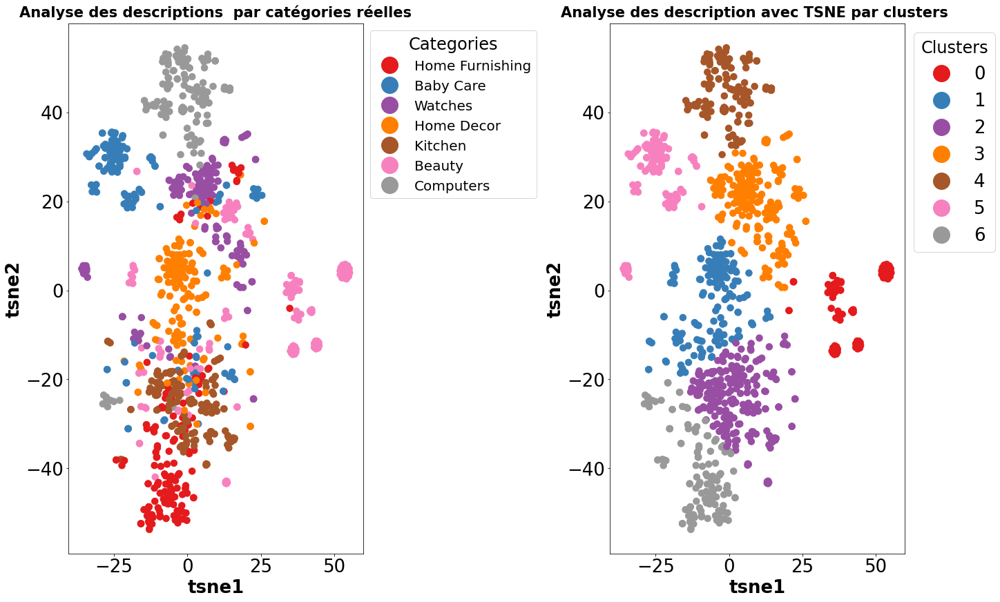

CountVectorizer pour lem à un ARI :  0.4618


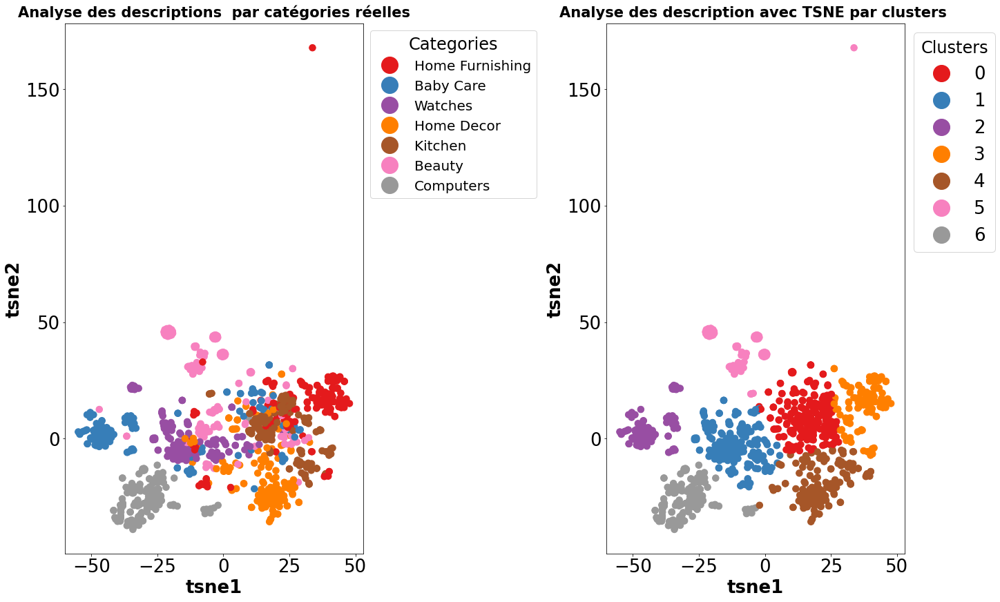

CountVectorizer pour sansNumberLem à un ARI :  0.4305


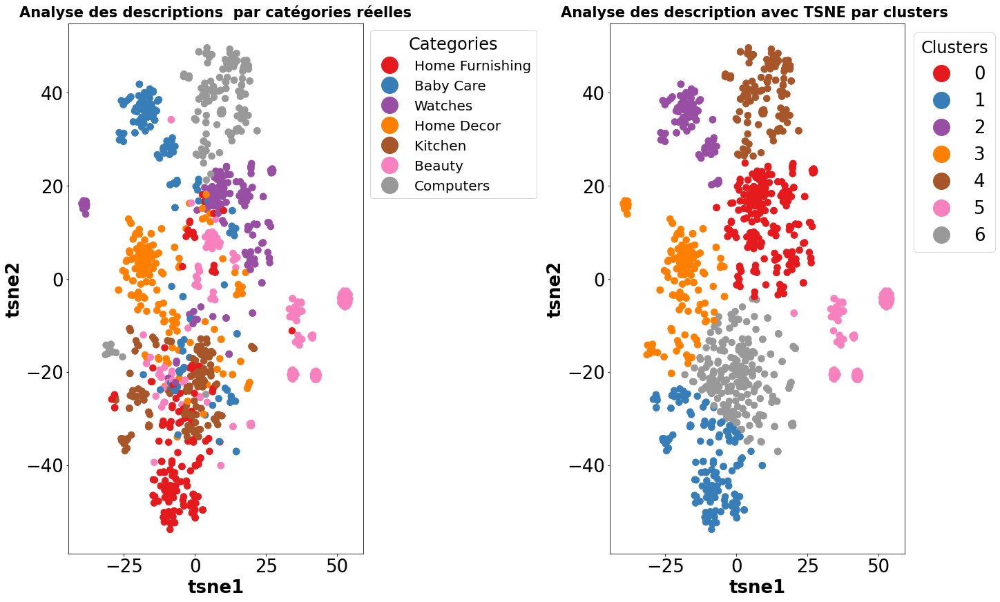

CountVectorizer pour sansCouleurLem à un ARI :  0.4144


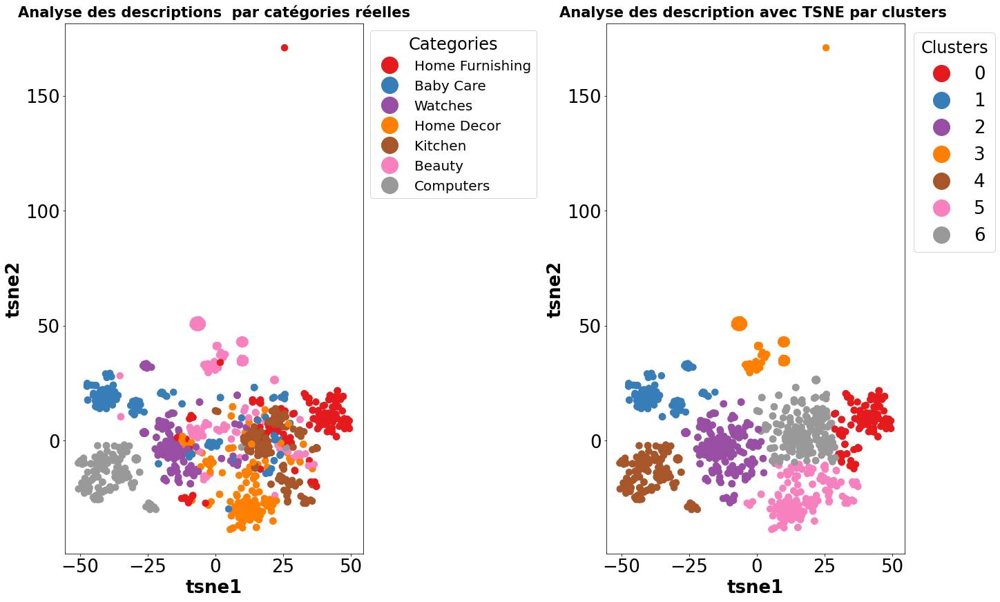

CountVectorizer pour sansNumberCouleurLem à un ARI :  0.4343


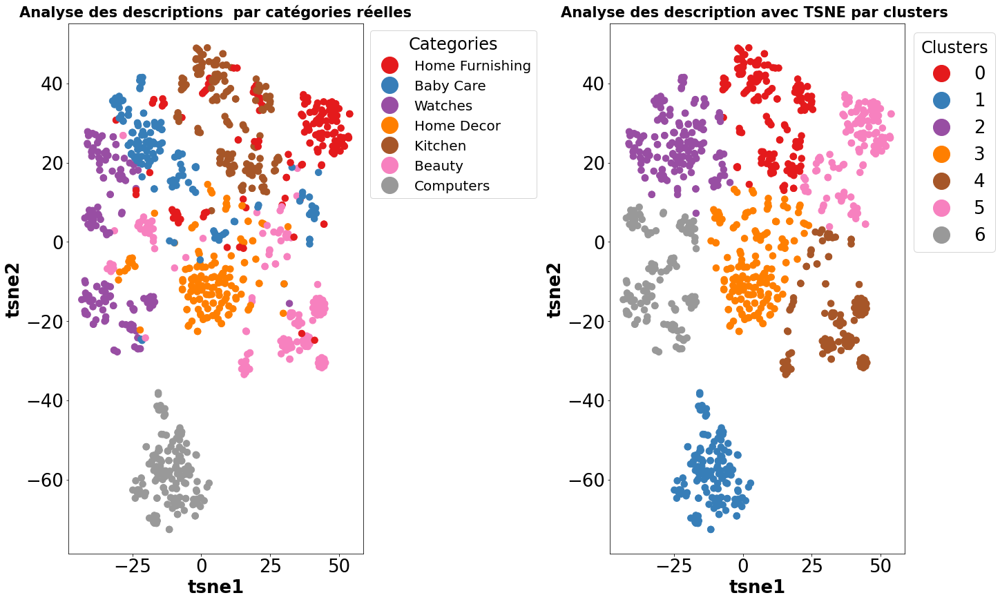

TfidfVectorizer pour bow à un ARI :  0.5961


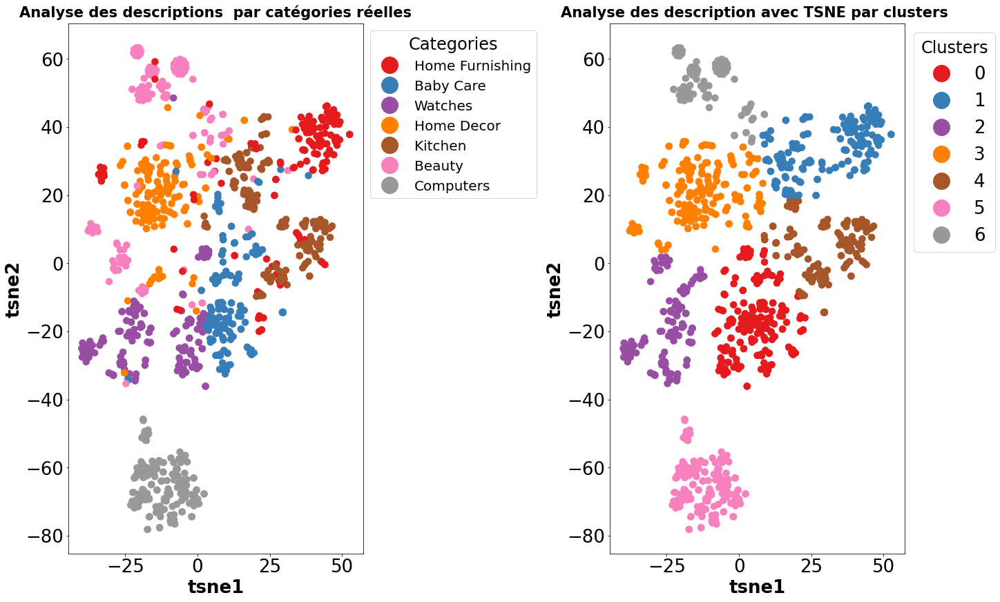

TfidfVectorizer pour sansNumberBow à un ARI :  0.5097


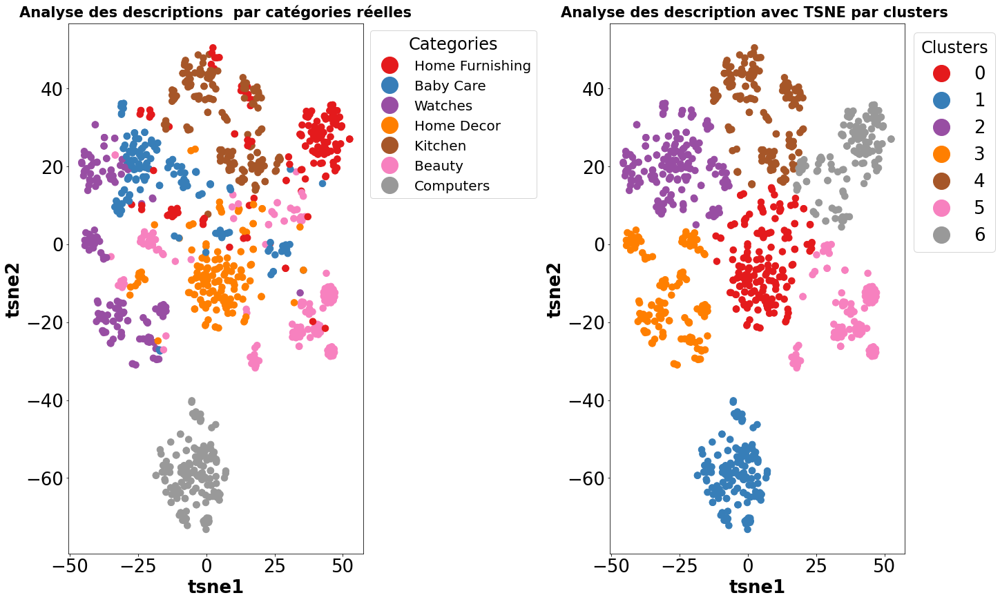

TfidfVectorizer pour sansCouleurBow à un ARI :  0.5498


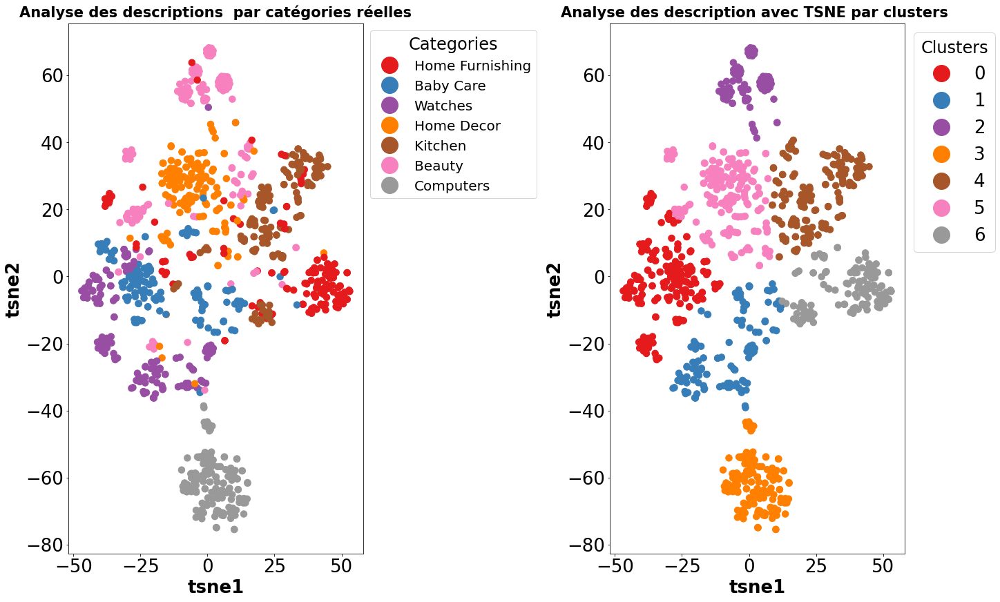

TfidfVectorizer pour sansNumberCouleurBow à un ARI :  0.4938


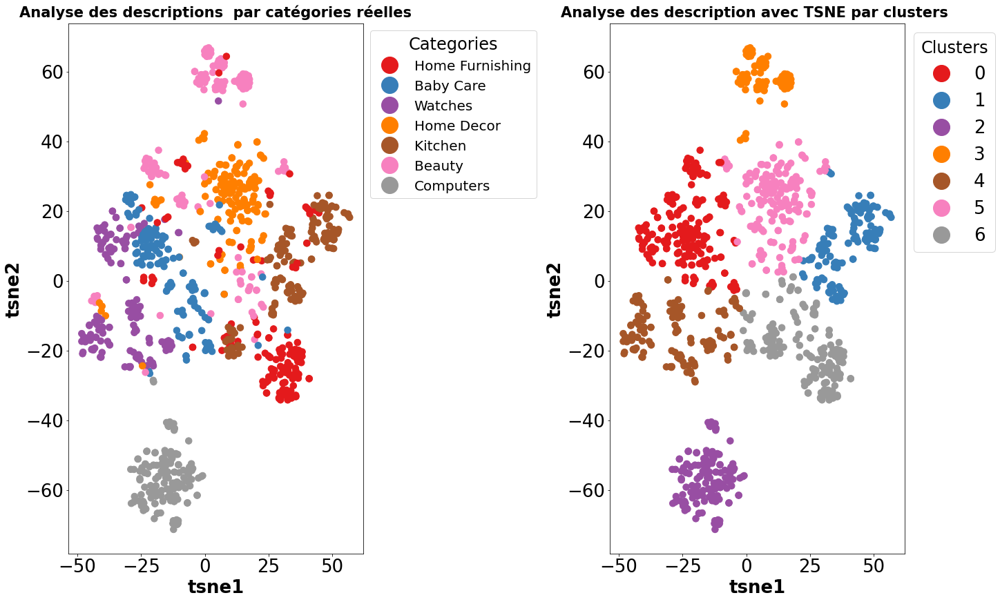

TfidfVectorizer pour lem à un ARI :  0.5196


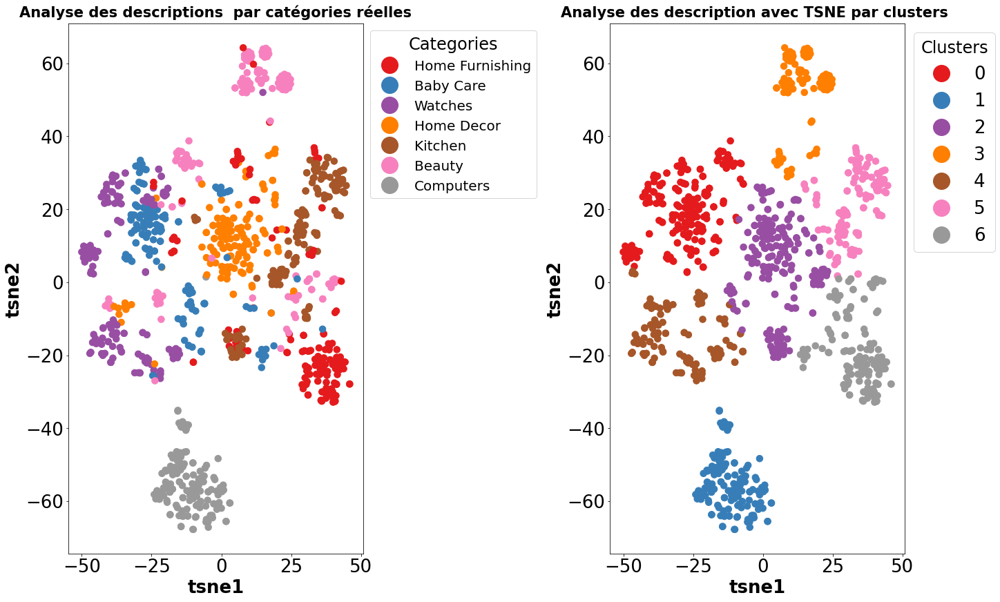

TfidfVectorizer pour sansNumberLem à un ARI :  0.4364


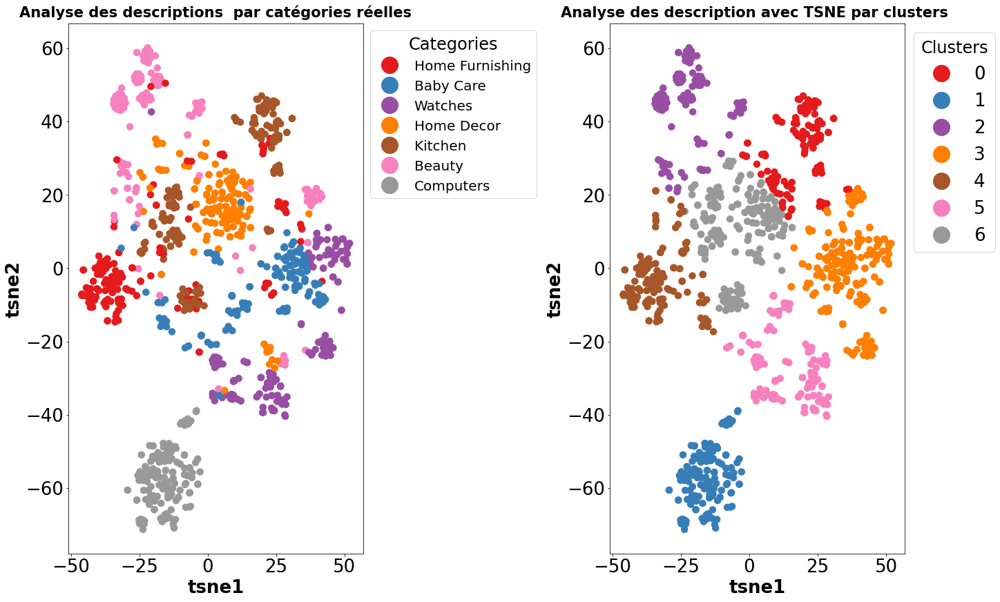

TfidfVectorizer pour sansCouleurLem à un ARI :  0.4313


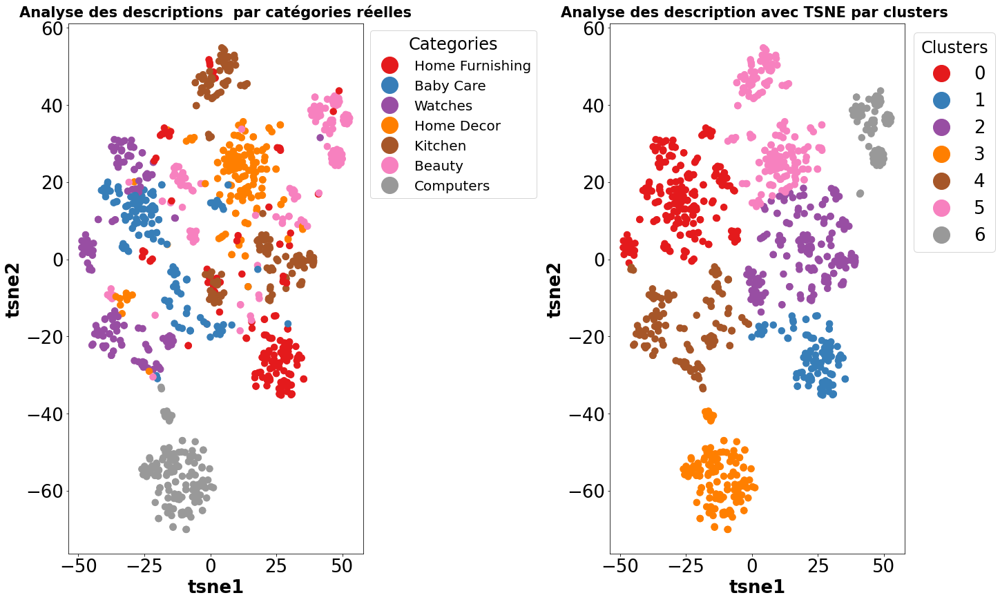

TfidfVectorizer pour sansNumberCouleurLem à un ARI :  0.4156


In [96]:
for val in list(METHODS.keys()):
    for i in TYPES:
        TSNE_visu_fct(globals()["ARI_c_"+val+i], globals()["X_tsne_c_"+val+i], globals()["labels_c_"+val+i], cible,
                      label_categorie, val, i,"sansColor")

### Bigramme et word by word  avec retrait des couleurs

In [100]:
global str

for val in list(METHODS.keys()):
    for i in TYPES:
        globals()["ARI_3_"+val+i], globals()["X_tsne_3_"+val+i], globals()["labels_3_"+val+i] =\
        Bag_of_word(df_etude, METHODS[val], "description_"+i, nombre_cible, label_categorie, 3)

<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3039 time :  9.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.359 time :  9.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.2995 time :  12.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.379 time :  9.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3264 time :  10.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3438 time :  8.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3023 time :  10.0
<class 'sklearn.feature_extraction.text.CountVectorizer'>
--------
ARI :  0.3473 time :  8.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI :  0.4317 time :  7.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
ARI :  0.4486 time :  7.0
<class 'sklearn.feature_extraction.text.TfidfVectorizer'>
--------
AR

dans le cas 3:
* countvec <br/>
    -Pour Bow sans nombre augmente et sans couleur abaisse l'indice ARI et la combinaison est meilleur (0.379) <br/>
    -Pour lem sans nombre augmente et sans couleur abaisse l'indice ARI et la combinaison est meilleur (0.3473) <br/>
=> dans le cas de Countvec le prepocessing "tokenize & sansponctuation& stop_word &low & sans nombre et couleur" donne le meilleur resultat


* tf-idf <br/>
    -Pour Bow  sans nombre augmente (0.4486)et sans couleur abaisse l'indice ARI et la combinaison est meilleur que la valeur de depart mais n'est pas optimale<br/>
    -Pour Lem  sans nombre augmente (0.5414)et sans couleur abaisse l'indice ARI et la combinaison est meilleur que la valeur de depart mais n'est pas optimale <br/>
=> dans le cas de tf-idf  le prepocessing "tokenize & sansponctuation& stop_word &low & lemmatisation & sans nombre" donne le meilleur resultat    
<br/>

Des deux methode c'est tf-idf qui est meilleure

<br/>

Des 3 cas  le cas de tf-idf le prepocessing "tokenize & sansponctuation& stop_word &low & sans couleur" donne le meilleur resultat 

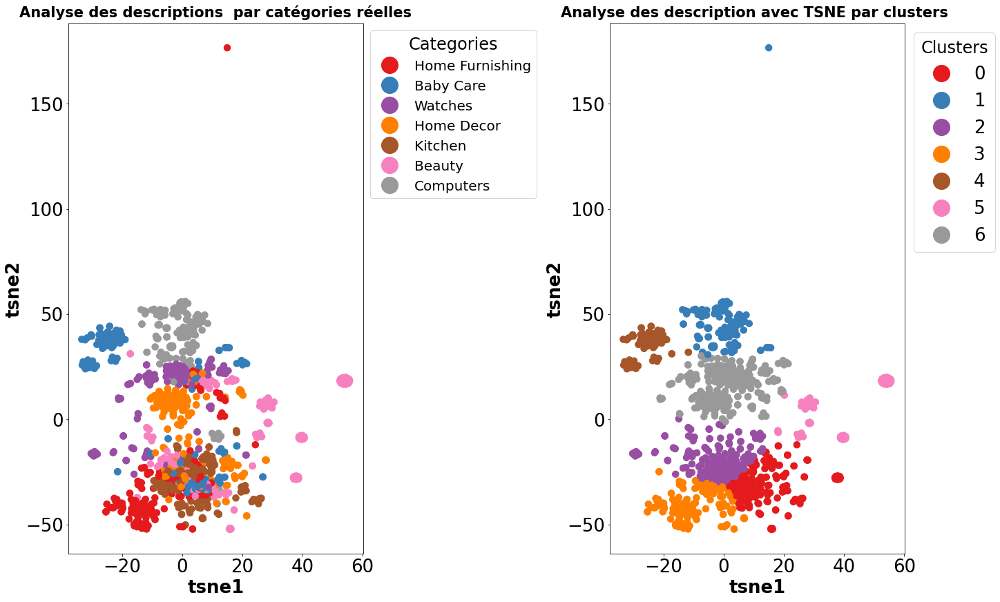

CountVectorizer pour bow à un ARI :  0.3039


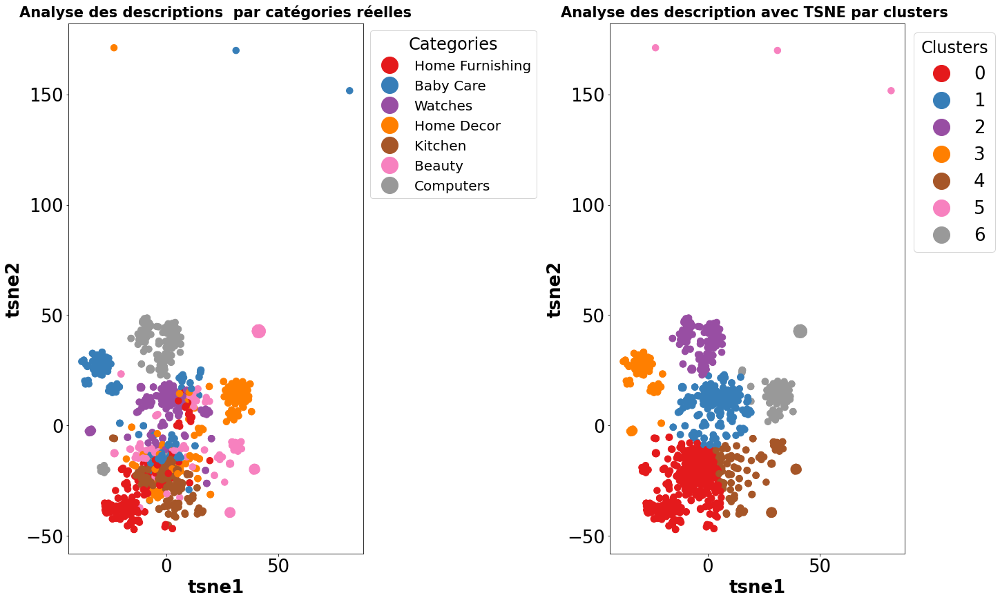

CountVectorizer pour sansNumberBow à un ARI :  0.359


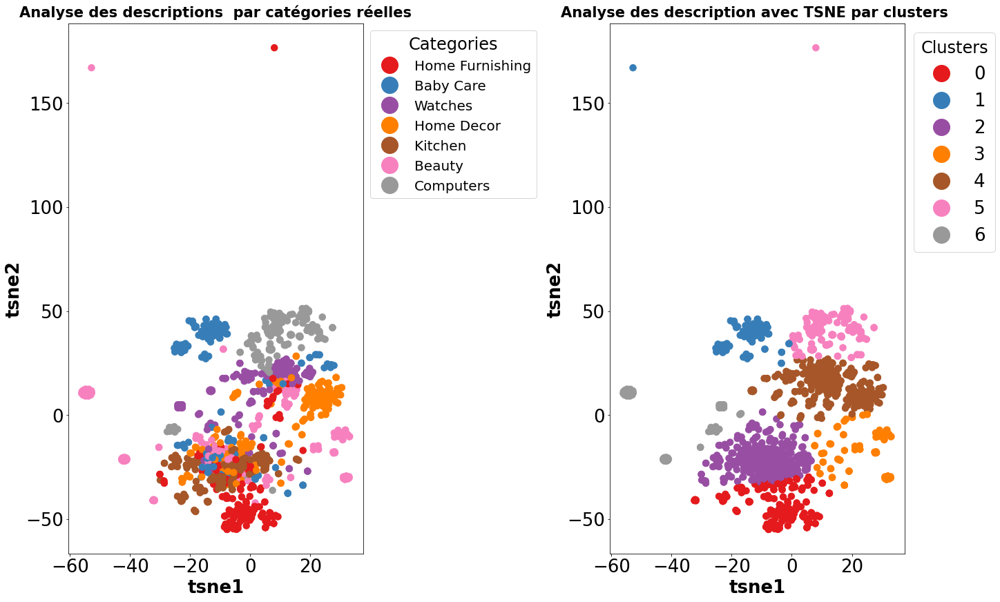

CountVectorizer pour sansCouleurBow à un ARI :  0.2995


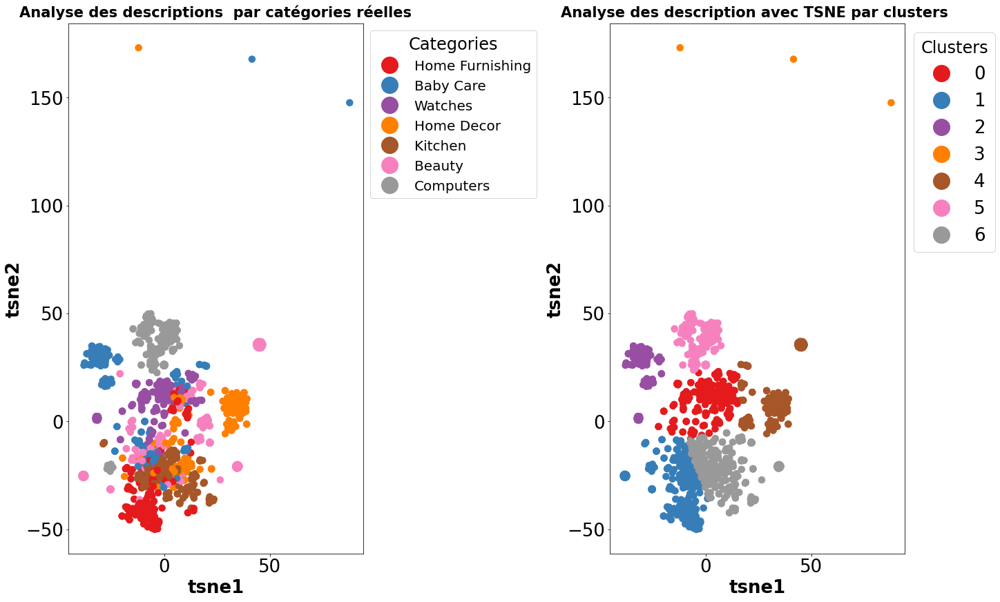

CountVectorizer pour sansNumberCouleurBow à un ARI :  0.379


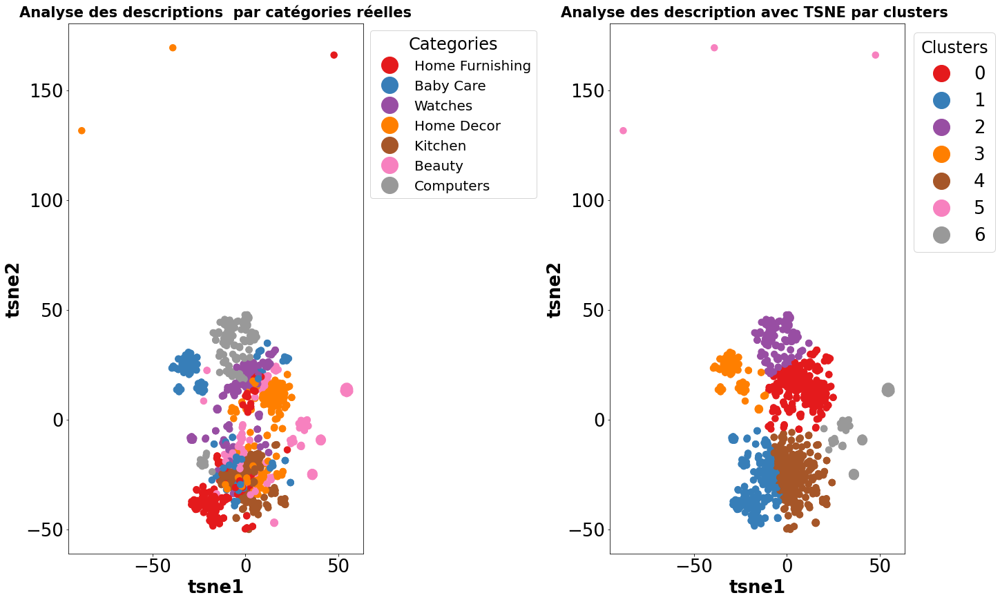

CountVectorizer pour lem à un ARI :  0.3264


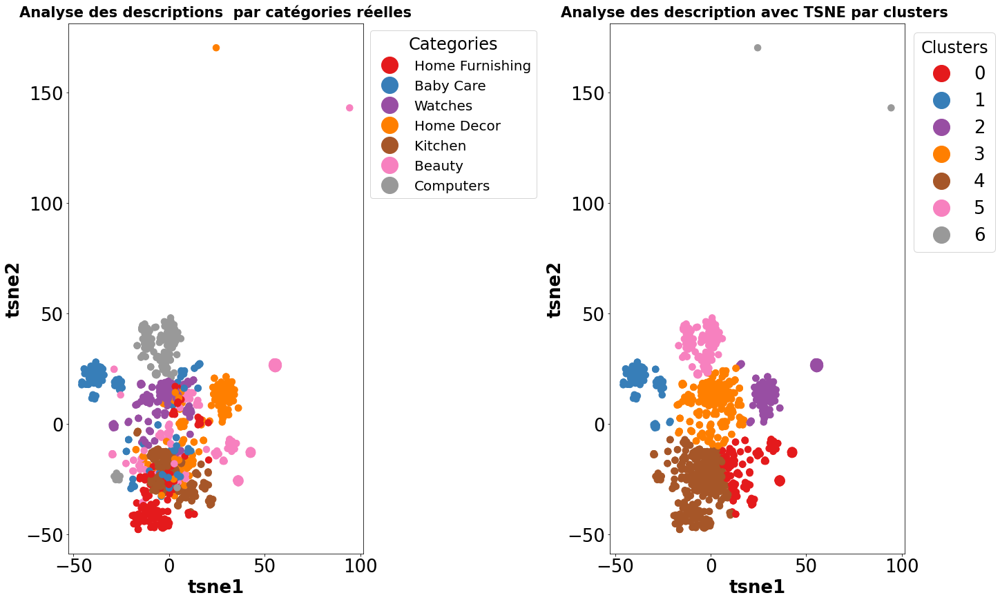

CountVectorizer pour sansNumberLem à un ARI :  0.3438


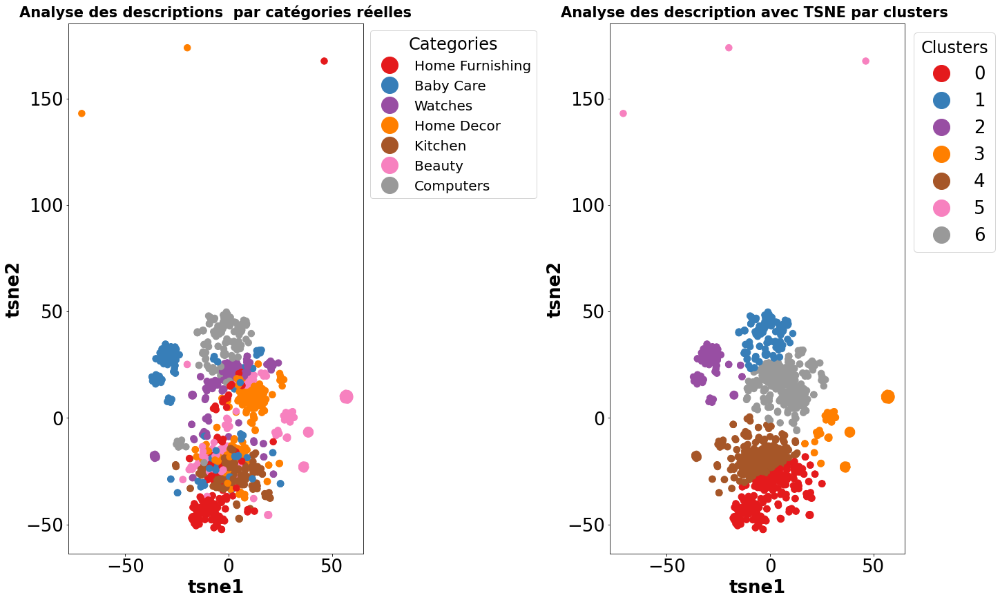

CountVectorizer pour sansCouleurLem à un ARI :  0.3023


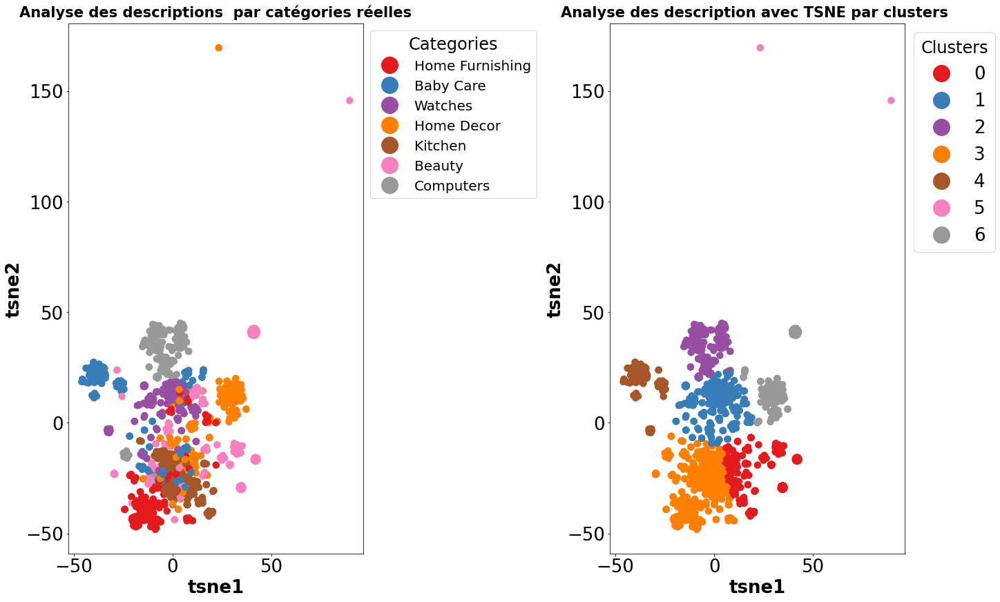

CountVectorizer pour sansNumberCouleurLem à un ARI :  0.3473


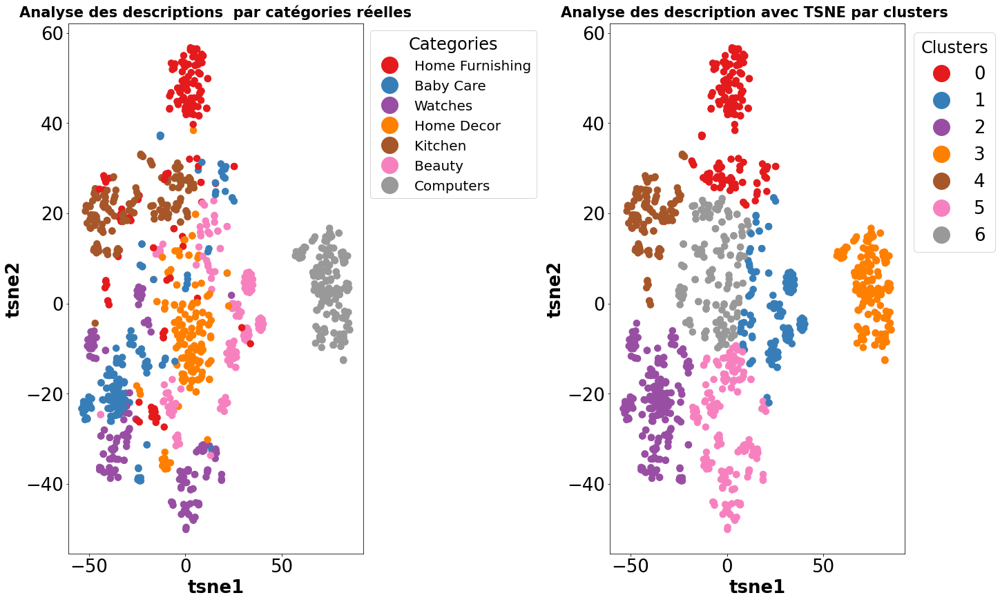

TfidfVectorizer pour bow à un ARI :  0.4317


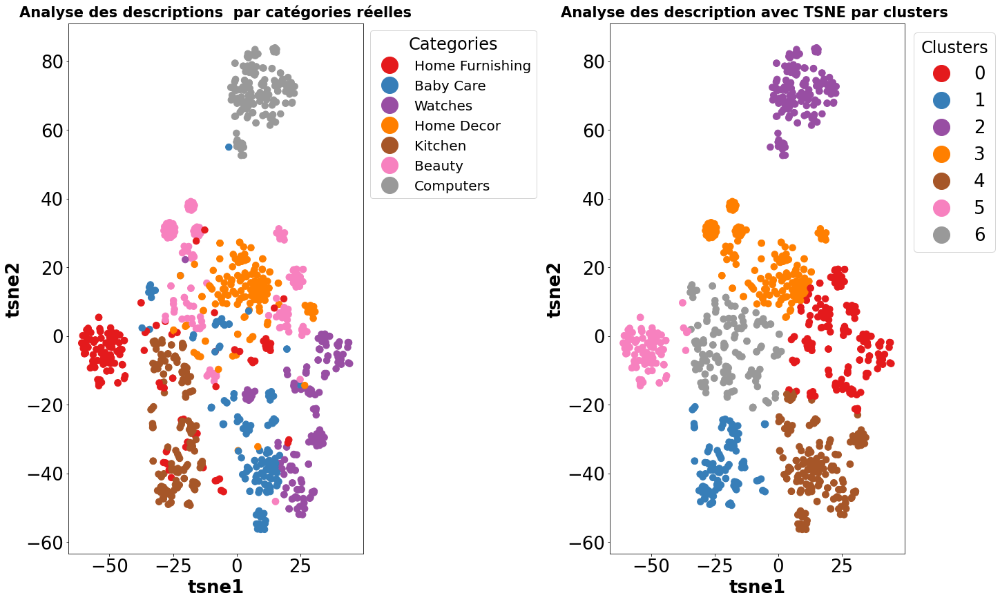

TfidfVectorizer pour sansNumberBow à un ARI :  0.4486


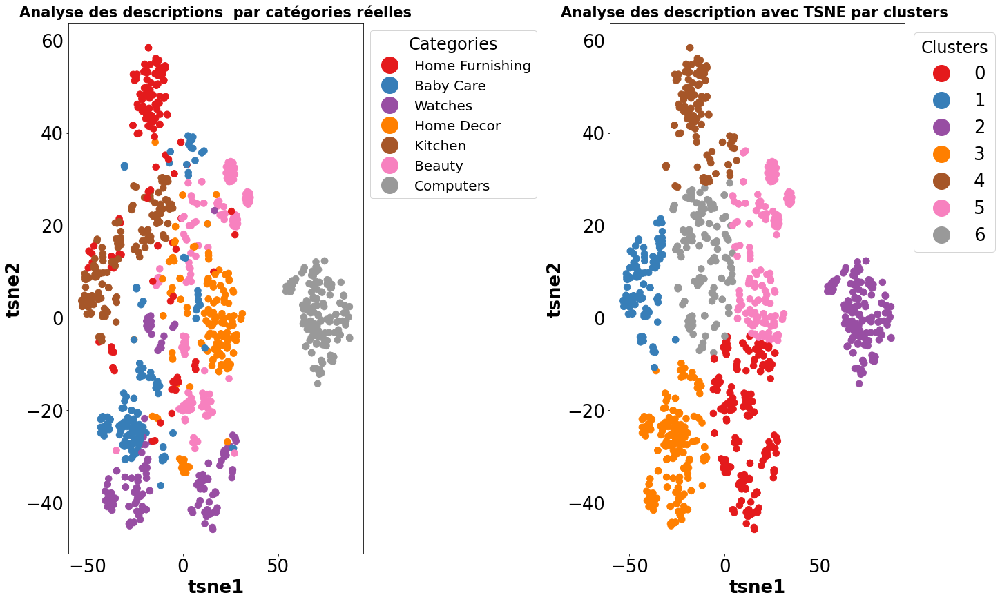

TfidfVectorizer pour sansCouleurBow à un ARI :  0.4109


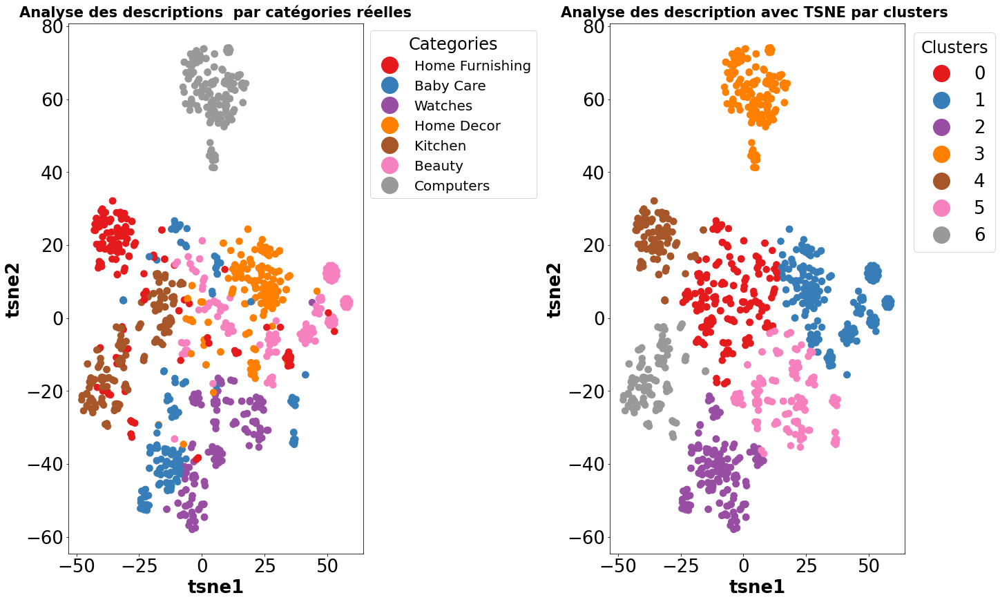

TfidfVectorizer pour sansNumberCouleurBow à un ARI :  0.4473


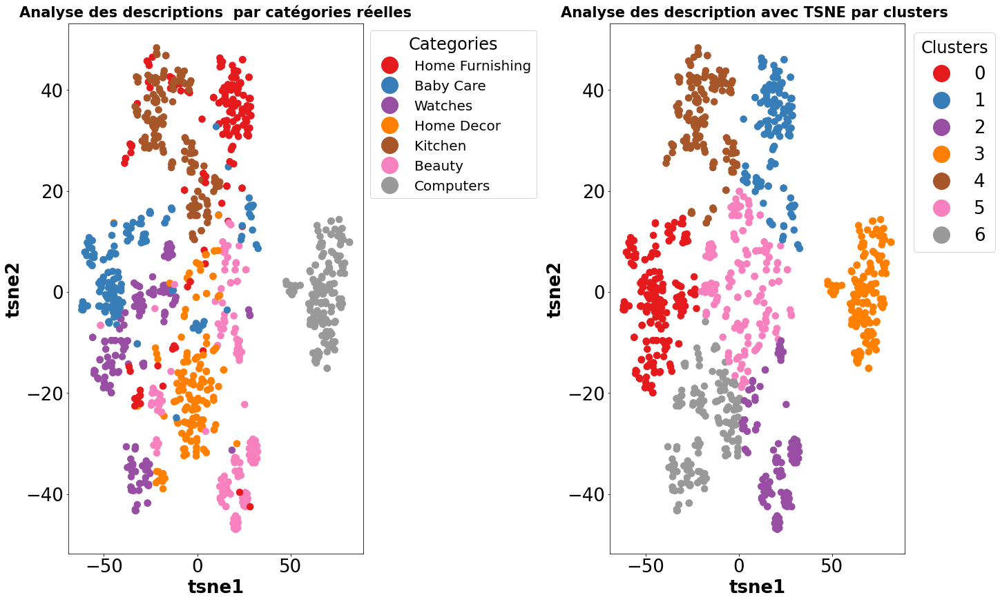

TfidfVectorizer pour lem à un ARI :  0.456


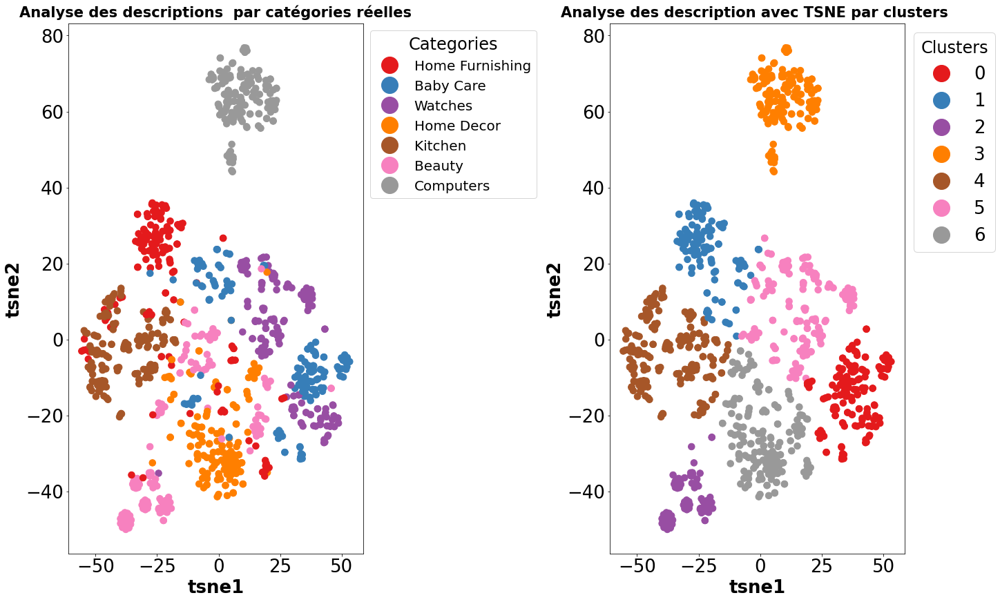

TfidfVectorizer pour sansNumberLem à un ARI :  0.5414


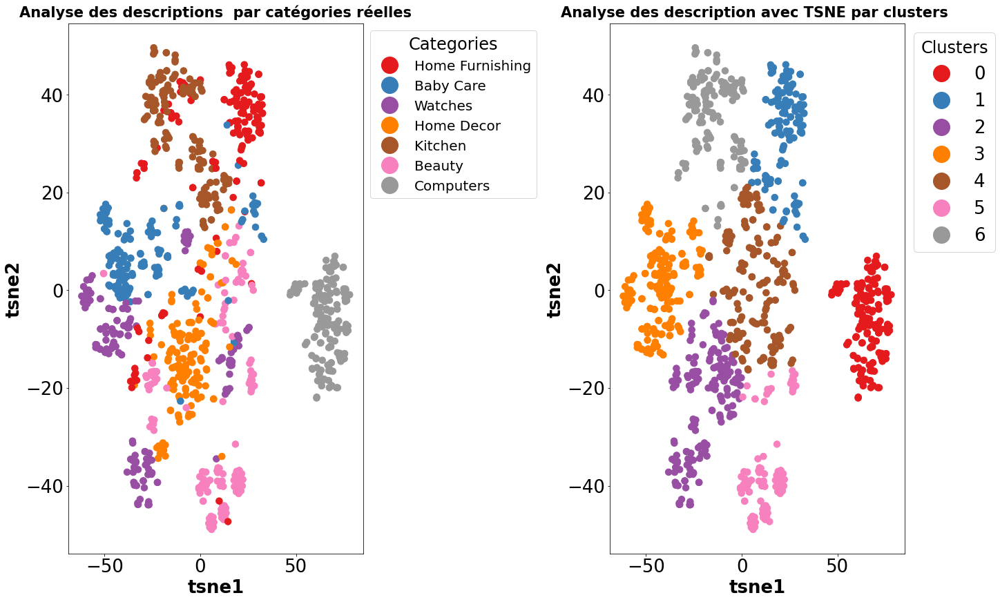

TfidfVectorizer pour sansCouleurLem à un ARI :  0.4635


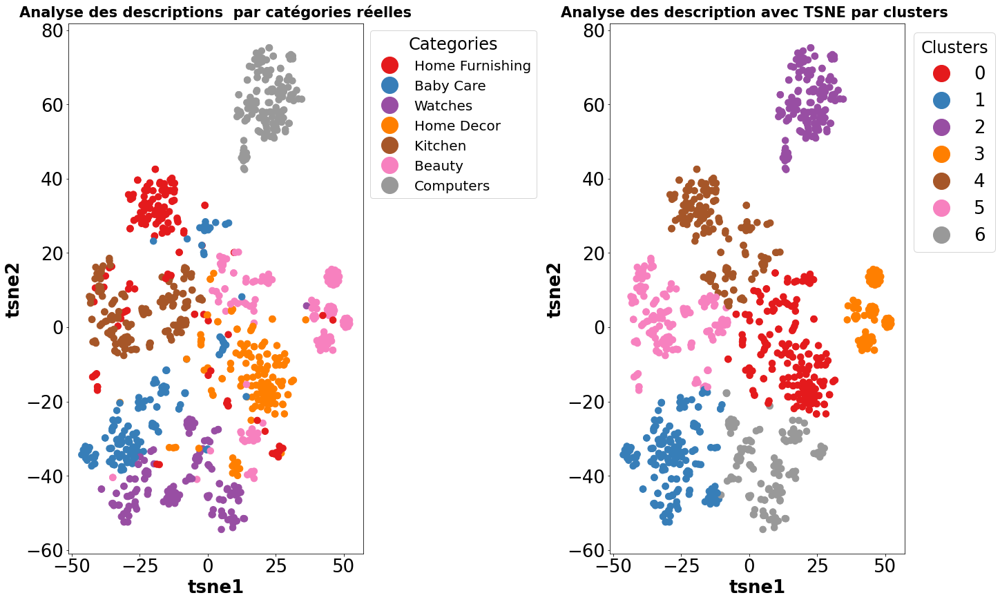

TfidfVectorizer pour sansNumberCouleurLem à un ARI :  0.5268


In [102]:
for val in list(METHODS.keys()):
    for i in TYPES:
        TSNE_visu_fct(globals()["ARI_3_"+val+i], globals()["X_tsne_3_"+val+i],globals()["labels_3_"+val+i],
                      cible, label_categorie,  val, i, "bigramScolor")

# 3/ Modèles

## 3-1/ Modèle Word2Vec

In [63]:
 # adapation pour wordtovec
def adapation_description(df, variable):
    sentences = df[variable].to_list()
    sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

    return sentences

In [64]:
# Création et entraînement du modèle Word2Vec
def model_Word2Vec(df, variable):
    sentences = adapation_description(df, variable)
    vector_size=300
    window=5
    min_count=1
    epochs=100
    print("contrusction & entrainement ...")
    w2v_model = gensim.models.word2vec.Word2Vec(vector_size=vector_size, window=window, min_count=min_count,
                                                    seed=42,
                                                    workers=-1, sg=0)


    w2v_model.build_vocab(sentences)
    #w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=epochs)
    w2v_model.train(sentences, total_examples=len(sentences), epochs=epochs)
    vocabulaire= w2v_model.wv.index_to_key
    taille_vocabulaire = len(vocabulaire)
    print("la taille du vocabulaire est: %i" % taille_vocabulaire)
    print("Word2Vec entrainé")
    
    # Préparation des sentences (tokenization)
    tokenizer_etude = Tokenizer()
    tokenizer_etude.fit_on_texts(sentences)

    maxlen = 24
    x_sentences = pad_sequences(tokenizer_etude.texts_to_sequences(sentences),
                                                         maxlen=maxlen,
                                                         padding='post') 

    frequence_mots=   tokenizer_etude.word_index                                               
    nombre_mots = len(tokenizer_etude.word_index) + 1
    print("Nombre de mot unique est: %i" % nombre_mots)
    

    # Création de la matrice d'embedding
    embedding_matrix = np.zeros((nombre_mots, vector_size))
    i=0
    j=0

    for word, idx in frequence_mots.items():
        i +=1
        if word in vocabulaire:
            j +=1
            embedding_vector = w2v_model.wv[word]
            if embedding_vector is not None:
                embedding_matrix[idx] = w2v_model.wv[word]

    taux_mots = np.round(j/i,4)
    print("Word embedding rate : ", taux_mots)
    print("Embedding matrix: %s" % str(embedding_matrix.shape))    
    
    
    word_input=Input(shape=(maxlen,),dtype='float64')
    word_embedding = Embedding(nombre_mots,  vector_size,    weights = [embedding_matrix],
                             input_length=maxlen, trainable=True)(word_input)
    word_vec=GlobalAveragePooling1D()(word_embedding) 

    model_pooling1D = Model([word_input],word_vec, )

    print("\n avec GlobalAveragePooling1D ...")
    model_pooling1D.summary()
    
    features_w2v_1 = model_pooling1D.predict(x_sentences)

    #cas simple 
    print("\n avec juste word2vec ...")    
    embedding_layer = Embedding(nombre_mots, vector_size, weights=[embedding_matrix], 
                               input_length=maxlen, trainable=True)
    model_simple = Sequential([
        embedding_layer, LSTM(300, dropout=0.2, recurrent_dropout=0.2),
        Dense(nombre_cible, activation='sigmoid')

    ])

    model_simple.summary()
    features_w2v_2 = model_simple.predict(x_sentences)
    

    return w2v_model, vocabulaire, x_sentences, features_w2v_1, features_w2v_2


def recup_features_Word2Vec(df,variable):
    model_w2v, vocabulaire, x_sentences, features_w2v_1, features_w2v_2=\
    model_Word2Vec(df, variable)
    ARI_w2v_1, X_tsne_w2v_1, labels_w2v_1 = ARI_fct(features_w2v_1,nombre_cible, label_categorie)
    ARI_w2v_2, X_tsne_w2v_2, labels_w2v_2 = ARI_fct(features_w2v_2,nombre_cible, label_categorie)
    return ARI_w2v_1, X_tsne_w2v_1, labels_w2v_1, ARI_w2v_2, X_tsne_w2v_2, labels_w2v_2

In [342]:
 w2v_model, vocabulaire, x_sentences, features_w2v_1, features_w2v_2=\
model_Word2Vec(df_etude, "description_bow")
#ARI_w2v, X_tsne_w2v, labels_w2v = ARI_fct(model_w2v,nombre_cible, label_categorie)

contrusction & entrainement ...
la taille du vocabulaire est: 5083
Word2Vec entrainé
Nombre de mot unique est: 5084
Word embedding rate :  0.955
Embedding matrix: (5084, 300)

 avec GlobalAveragePooling1D ...
Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 24)]              0         
                                                                 
 embedding_32 (Embedding)    (None, 24, 300)           1525200   
                                                                 
 global_average_pooling1d_19  (None, 300)              0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 1,525,200
Trainable params: 1,525,200
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "seq

In [343]:
w2v_model.wv.most_similar("red")

[('breathless', 0.20727939903736115),
 ('modem', 0.18950343132019043),
 ('common', 0.18333595991134644),
 ('head', 0.1832113116979599),
 ('thakkar', 0.18225900828838348),
 ('organistick', 0.18110983073711395),
 ('flare', 0.17986547946929932),
 ('centre', 0.1772570013999939),
 ('tackle', 0.17654600739479065),
 ('srp', 0.17410269379615784)]

In [65]:
global str


for i in TYPES:
    globals()["ARI_"+i+"_1Dpooling"], globals()["X_tsne_"+i+"_1Dpooling"], globals()["labels_"+i+"_1Dpooling"],\
    globals()["ARI_"+i+"_w2cSimple"], globals()["X_tsne_"+i+"_w2cSimple"], globals()["labels_"+i+"_w2cSimple"] =\
    recup_features_Word2Vec(df_etude,"description_"+i)

contrusction & entrainement ...


la taille du vocabulaire est: 5083
Word2Vec entrainé
Nombre de mot unique est: 5084
Word embedding rate :  1.0
Embedding matrix: (5084, 300)

 avec GlobalAveragePooling1D ...
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding (Embedding)       (None, 24, 300)           1525200   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,525,200
Trainable params: 1,525,200
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential"
____________________________

ARI :  0.1979 time :  5.0
contrusction & entrainement ...


la taille du vocabulaire est: 5083
Word2Vec entrainé
Nombre de mot unique est: 5084
Word embedding rate :  1.0
Embedding matrix: (5084, 300)

 avec GlobalAveragePooling1D ...
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_2 (Embedding)     (None, 24, 300)           1525200   
                                                                 
 global_average_pooling1d_1   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,525,200
Trainable params: 1,525,200
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_1"
________________________

ARI :  0.1741 time :  5.0
contrusction & entrainement ...


la taille du vocabulaire est: 4962
Word2Vec entrainé
Nombre de mot unique est: 4963
Word embedding rate :  1.0
Embedding matrix: (4963, 300)

 avec GlobalAveragePooling1D ...
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_4 (Embedding)     (None, 24, 300)           1488900   
                                                                 
 global_average_pooling1d_2   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,488,900
Trainable params: 1,488,900
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_2"
________________________

ARI :  0.1952 time :  5.0
contrusction & entrainement ...


la taille du vocabulaire est: 4962
Word2Vec entrainé
Nombre de mot unique est: 4963
Word embedding rate :  1.0
Embedding matrix: (4963, 300)

 avec GlobalAveragePooling1D ...
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_6 (Embedding)     (None, 24, 300)           1488900   
                                                                 
 global_average_pooling1d_3   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,488,900
Trainable params: 1,488,900
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_3"
________________________

ARI :  0.1877 time :  6.0
contrusction & entrainement ...


la taille du vocabulaire est: 4668
Word2Vec entrainé
Nombre de mot unique est: 4669
Word embedding rate :  1.0
Embedding matrix: (4669, 300)

 avec GlobalAveragePooling1D ...
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_8 (Embedding)     (None, 24, 300)           1400700   
                                                                 
 global_average_pooling1d_4   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,400,700
Trainable params: 1,400,700
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_4"
________________________

ARI :  0.1972 time :  5.0
contrusction & entrainement ...


la taille du vocabulaire est: 4668
Word2Vec entrainé
Nombre de mot unique est: 4669
Word embedding rate :  1.0
Embedding matrix: (4669, 300)

 avec GlobalAveragePooling1D ...
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_10 (Embedding)    (None, 24, 300)           1400700   
                                                                 
 global_average_pooling1d_5   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,400,700
Trainable params: 1,400,700
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_5"
________________________

ARI :  0.2017 time :  5.0
contrusction & entrainement ...


la taille du vocabulaire est: 4561
Word2Vec entrainé
Nombre de mot unique est: 4562
Word embedding rate :  1.0
Embedding matrix: (4562, 300)

 avec GlobalAveragePooling1D ...
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_12 (Embedding)    (None, 24, 300)           1368600   
                                                                 
 global_average_pooling1d_6   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,368,600
Trainable params: 1,368,600
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_6"
________________________

ARI :  0.1893 time :  5.0
contrusction & entrainement ...


la taille du vocabulaire est: 4561
Word2Vec entrainé
Nombre de mot unique est: 4562
Word embedding rate :  1.0
Embedding matrix: (4562, 300)

 avec GlobalAveragePooling1D ...
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_14 (Embedding)    (None, 24, 300)           1368600   
                                                                 
 global_average_pooling1d_7   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,368,600
Trainable params: 1,368,600
Non-trainable params: 0
_________________________________________________________________

 avec juste word2vec ...
Model: "sequential_7"
________________________

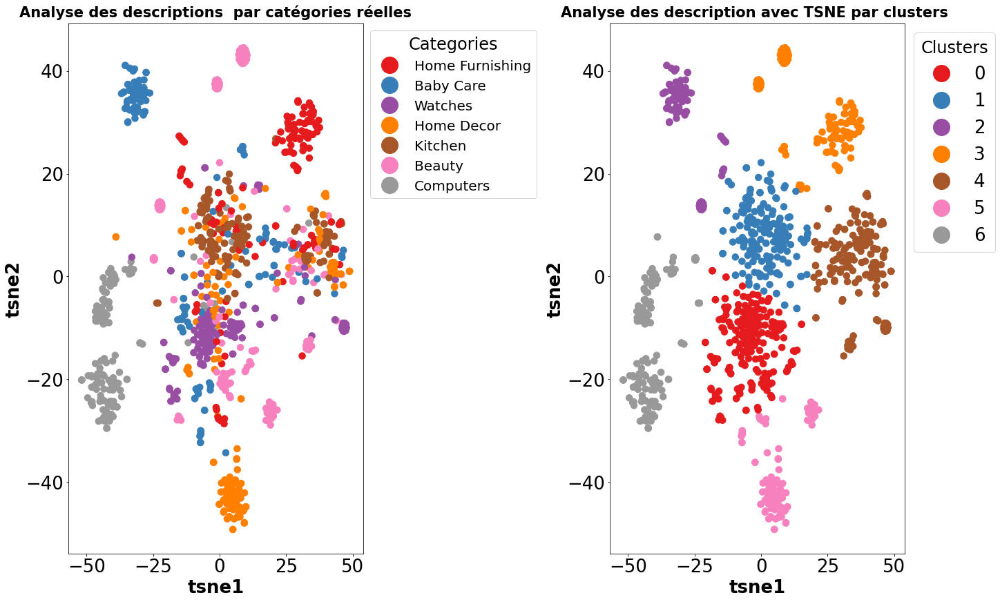

w2c_1 pour bow à un ARI :  0.3075


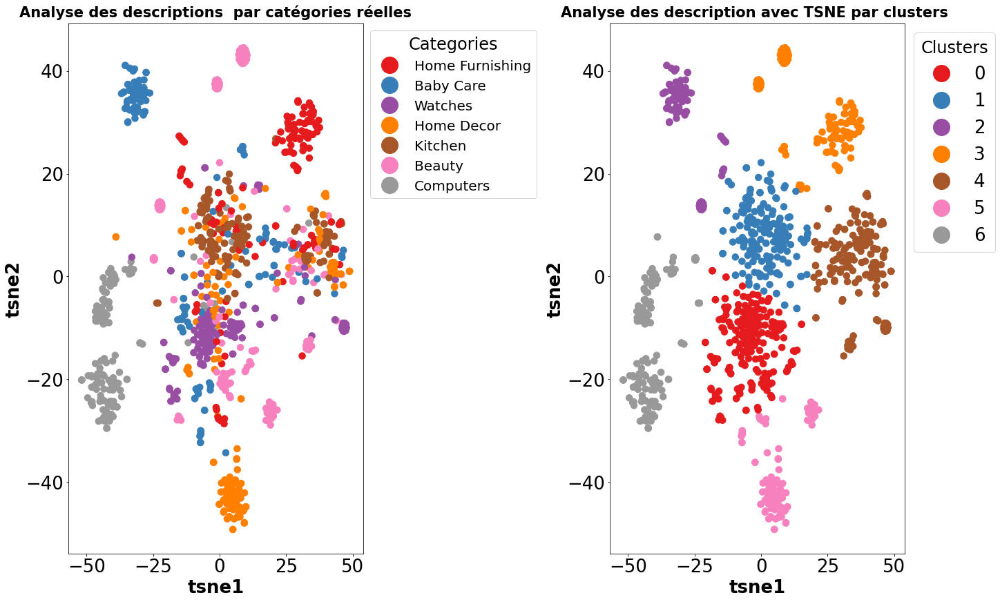

w2c_1 pour sansNumberBow à un ARI :  0.3075


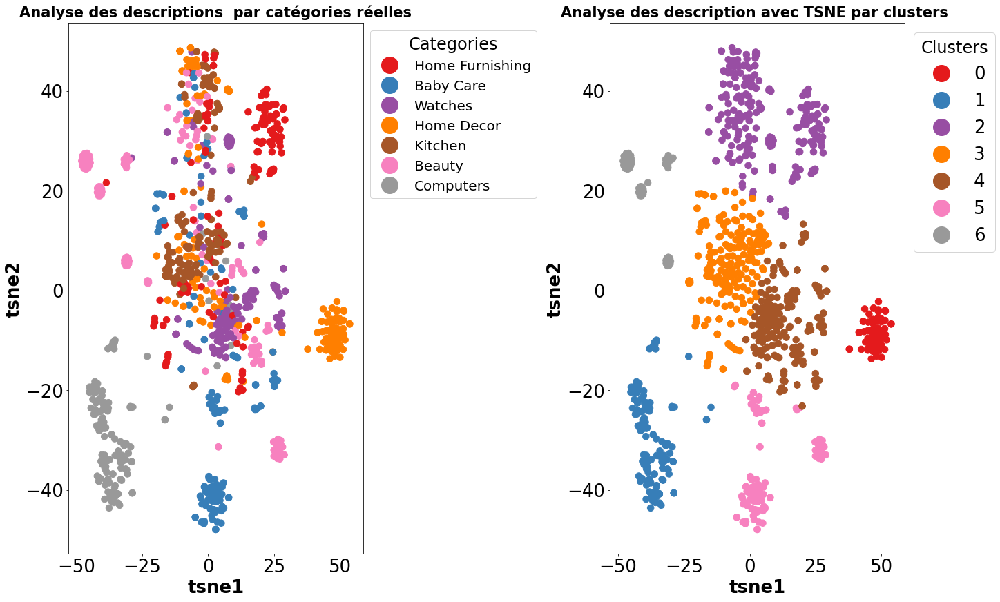

w2c_1 pour sansCouleurBow à un ARI :  0.3215


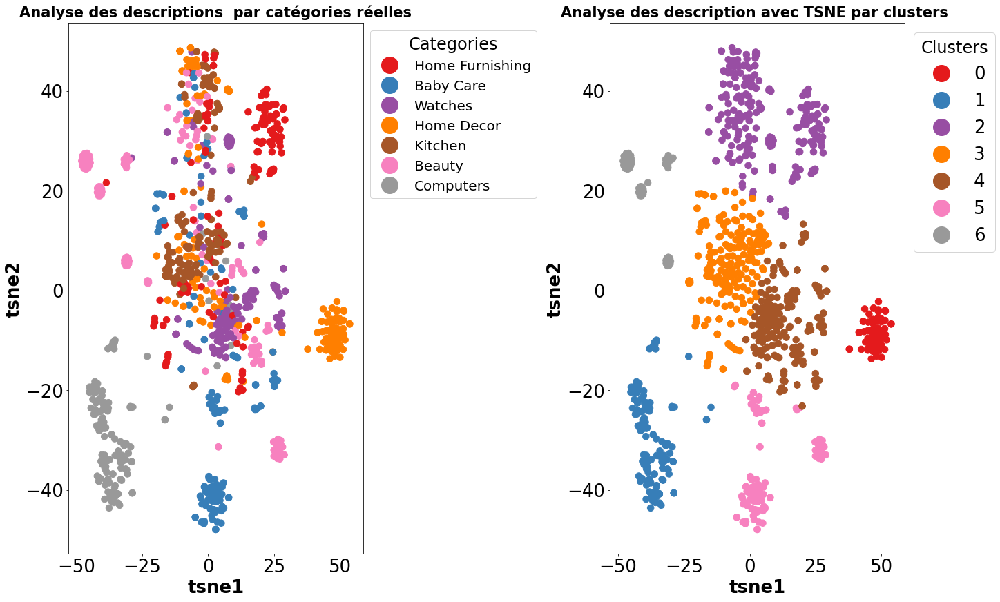

w2c_1 pour sansNumberCouleurBow à un ARI :  0.3215


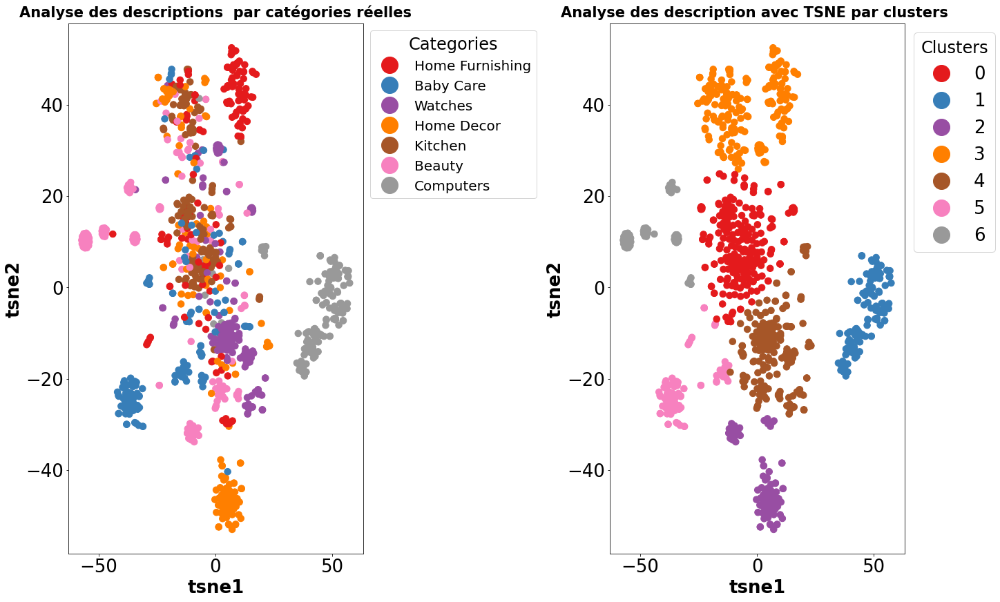

w2c_1 pour lem à un ARI :  0.2983


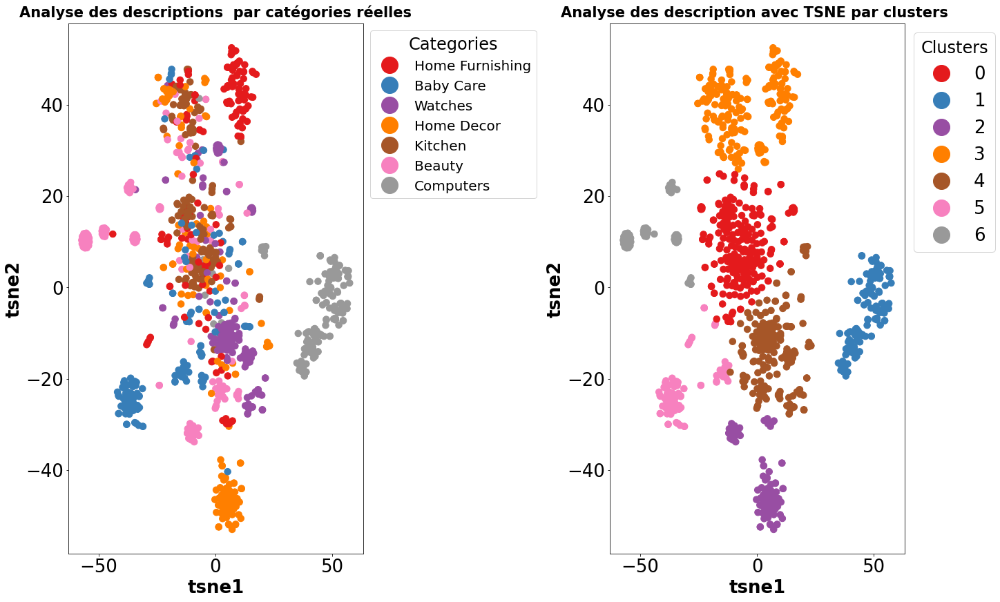

w2c_1 pour sansNumberLem à un ARI :  0.2983


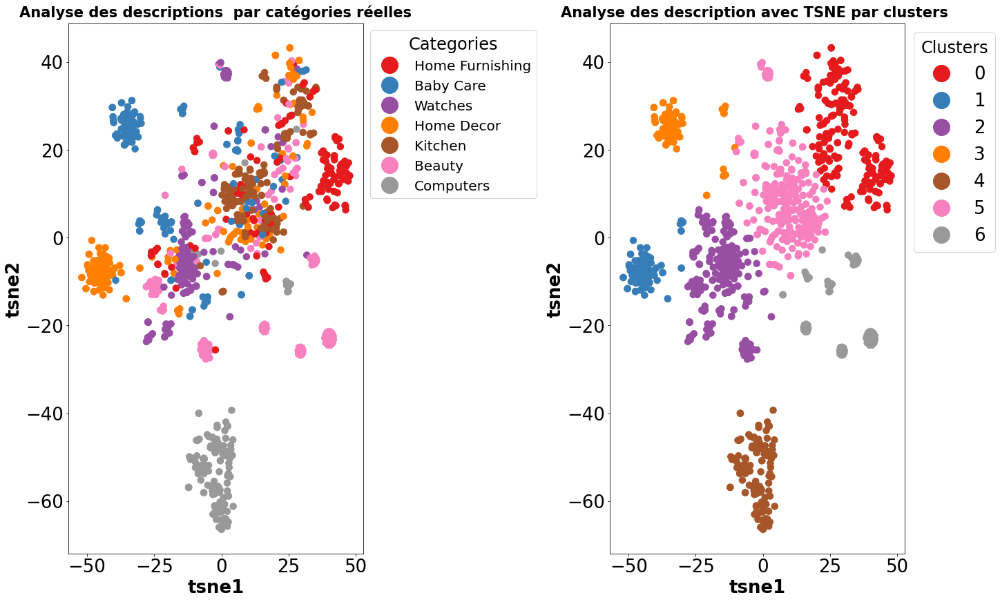

w2c_1 pour sansCouleurLem à un ARI :  0.2919


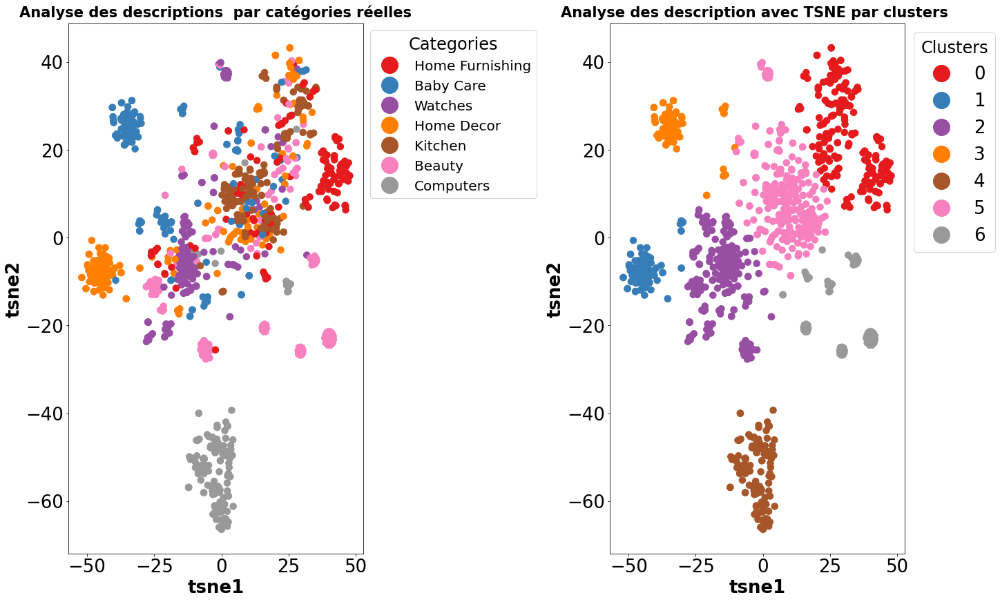

w2c_1 pour sansNumberCouleurLem à un ARI :  0.2919


In [107]:

for i in TYPES:
    TSNE_visu_fct(globals()["ARI_"+i+"_1Dpooling"], globals()["X_tsne_"+i+"_1Dpooling"], globals()["labels_"+i+"_1Dpooling"],
                  cible, label_categorie,"w2c_1", i, "1Dpooling")

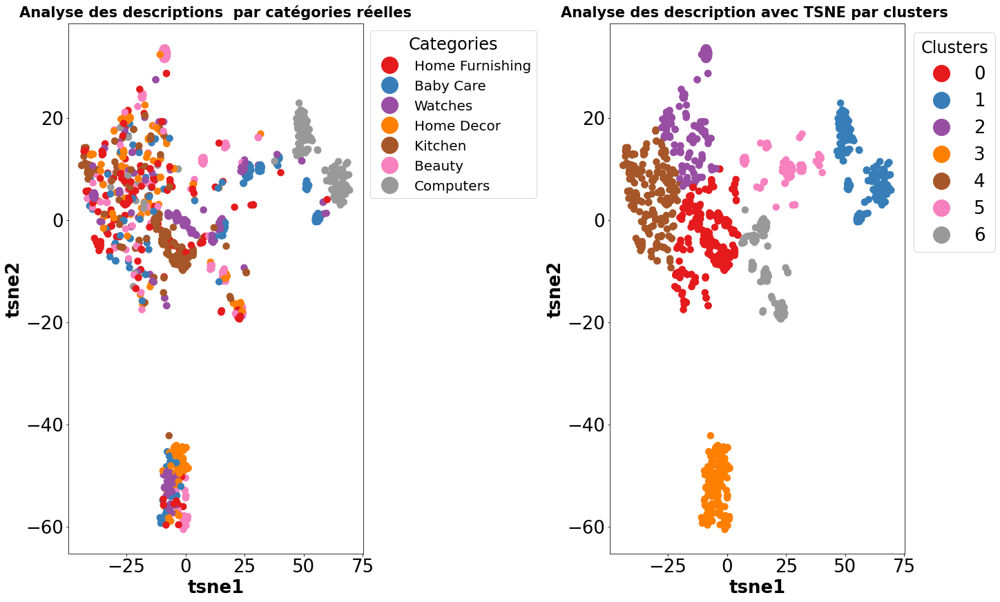

w2c_2 pour bow à un ARI :  0.1806


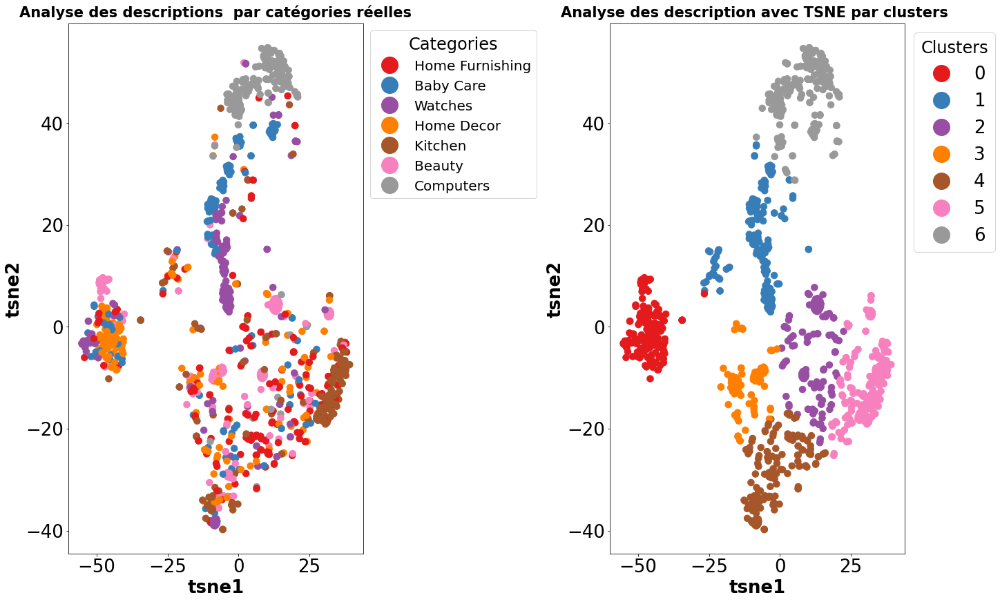

w2c_2 pour sansNumberBow à un ARI :  0.198


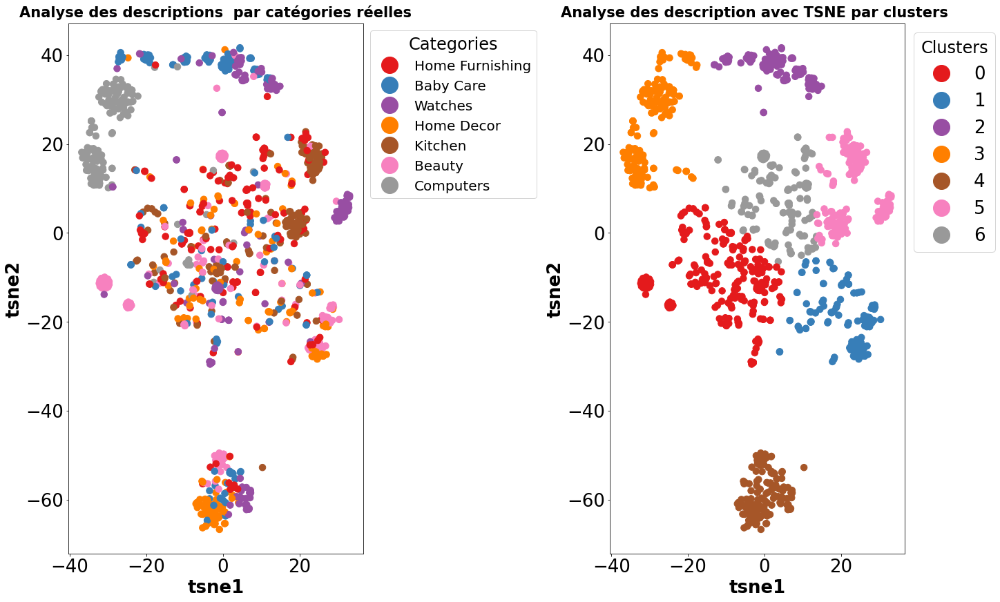

w2c_2 pour sansCouleurBow à un ARI :  0.2021


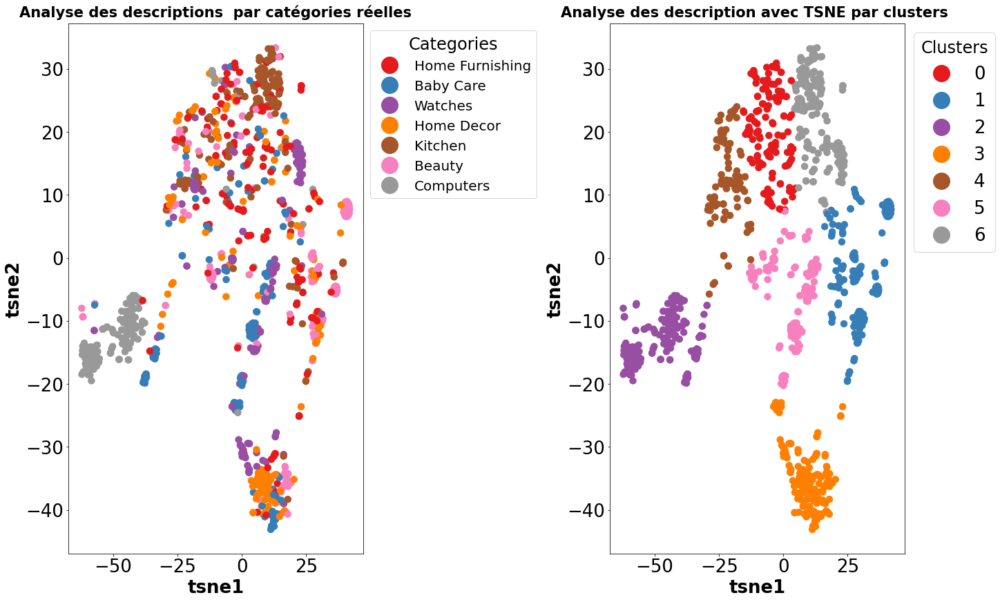

w2c_2 pour sansNumberCouleurBow à un ARI :  0.2025


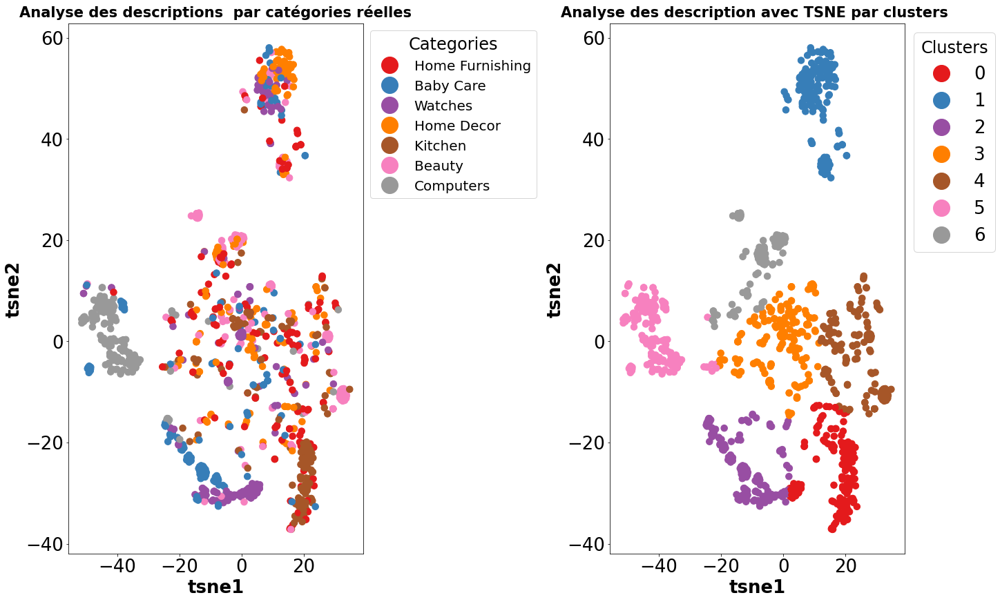

w2c_2 pour lem à un ARI :  0.1982


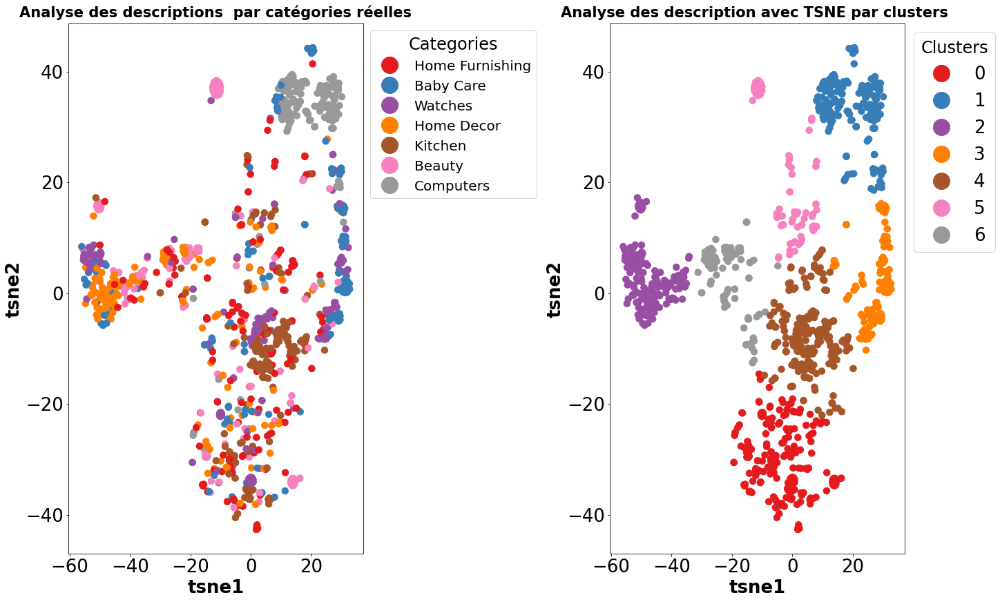

w2c_2 pour sansNumberLem à un ARI :  0.1848


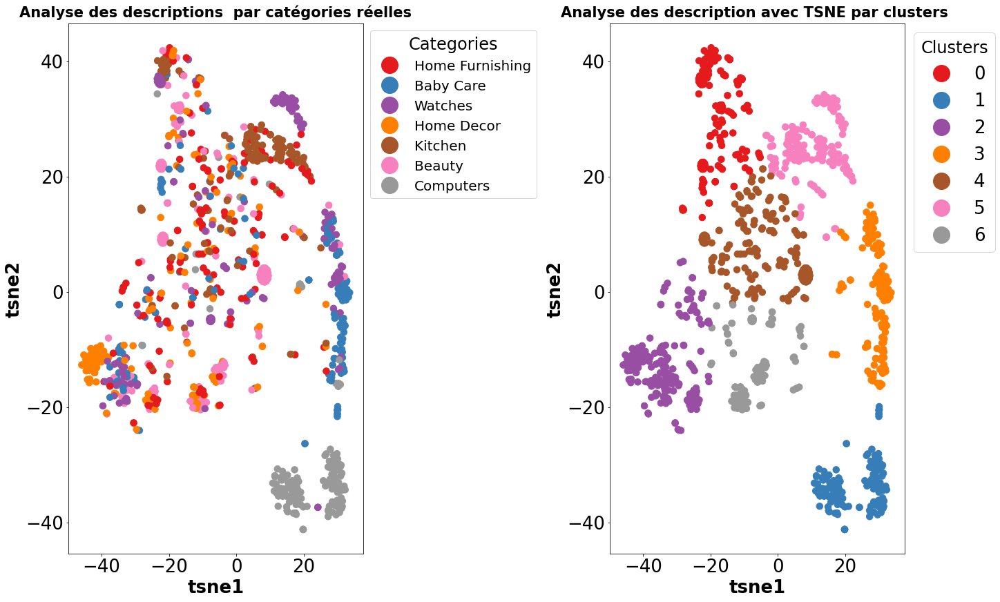

w2c_2 pour sansCouleurLem à un ARI :  0.2077


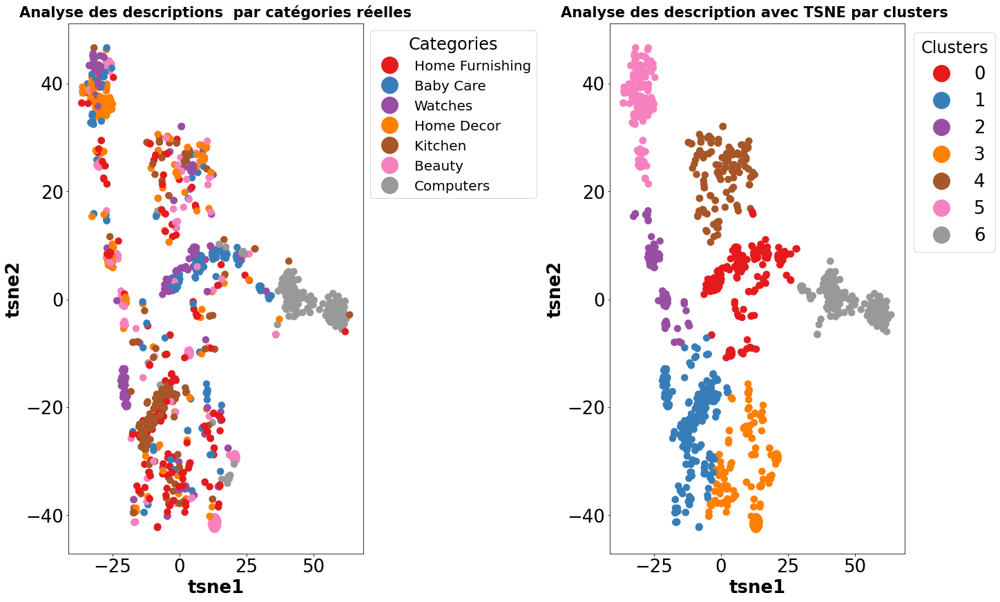

w2c_2 pour sansNumberCouleurLem à un ARI :  0.2003


In [108]:

for i in TYPES:
    TSNE_visu_fct(globals()["ARI_"+i+"_w2cSimple"], globals()["X_tsne_"+i+"_w2cSimple"], globals()["labels_"+i+"_w2cSimple"],
                  cible, label_categorie,"w2c_2", i,"w2cSimple")

In [148]:
METHODS

{'CountVectorizer': sklearn.feature_extraction.text.CountVectorizer,
 'TfidfVectorizer': sklearn.feature_extraction.text.TfidfVectorizer}

In [150]:
df_ARI=pd.DataFrame({"Word2Vec_1Dpooling": [globals()["ARI_"+i+"_w2cSimple"]for i in TYPES],
                     "Word2Vec_w2cSimple":[globals()["ARI_"+i+"_1Dpooling"]for i in TYPES],
                     "Tfidf_cas_1":[globals()["ARI_TfidfVectorizer"+i] for i in TYPES],
                     "Tfidf_cas_2":[globals()["ARI_c_TfidfVectorizer"+i] for i in TYPES],
                     "Tfidf_cas_3":[globals()["ARI_3_TfidfVectorizer"+i] for i in TYPES],
                     "CountVect_cas_1":[globals()["ARI_CountVectorizer"+i] for i in TYPES],
                     "CountVect_cas_2":[globals()["ARI_c_CountVectorizer"+i] for i in TYPES],
                     "CountVect_cas_3":[globals()["ARI_3_CountVectorizer"+i] for i in TYPES]},
                    
                                            index=TYPES)

Avec **Word2Vec et 1Dpooling**  la plus grande valeur de l'indice ARI est **0.3215** à la fois pour le prepocessing "tokenize & sansponctuation & stop_word & low & sans couleur". <br/>
Avec **Word2Vec et w2cSimple**  la plus grande valeur de l'indice ARI est **0.2077** à la fois pour le prepocessing "tokenize & sansponctuation & stop_word & low & sans couleur". Elle estdonc moins élevé en comparaison au cas où on utilise 1Dpooling

In [28]:
df_ARI.to_csv('ARI_df.csv', sep='\t', header=0, index_col=0)


In [68]:
df_ARI=pd.read_csv('ARI_df.csv', sep='\t', header=0, index_col=0)

In [69]:
df_ARI

,Word2Vec_1Dpooling,Word2Vec_w2cSimple,Tfidf_cas_1,Tfidf_cas_2,Tfidf_cas_3,CountVect_cas_1,CountVect_cas_2,CountVect_cas_3
,,,,,,,,
bow,0.3075,0.1806,0.5755,0.5961,0.4317,0.4110,0.3574,0.3039
sansNumberBow,0.3075,0.1980,0.4716,0.5097,0.4486,0.4399,0.3923,0.3590
sansCouleurBow,0.3215,0.2021,0.5961,0.5498,0.4109,0.3574,0.3736,0.2995
sansNumberCouleurBow,0.3215,0.2025,0.5097,0.4938,0.4473,0.3923,0.4071,0.3790
lem,0.2983,0.1982,0.4386,0.5196,0.4560,0.4036,0.4618,0.3264
sansNumberLem,0.2983,0.1848,0.4135,0.4364,0.5414,0.4235,0.4305,0.3438
sansCouleurLem,0.2919,0.2077,0.5103,0.4313,0.4635,0.4109,0.4144,0.3023
sansNumberCouleurLem,0.2919,0.2003,0.4622,0.4156,0.5268,0.4276,0.4343,0.3473


## Modèle deep learning

### 1/Fonctions

In [17]:
# Fonction de préparation des sentences
def preparation_entree_model(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_input = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_input['input_ids'][0])
        token_type_ids.append(bert_input['token_type_ids'][0])
        attention_mask.append(bert_input['attention_mask'][0])
        bert_inp_tot.append((bert_input['input_ids'][0], 
                             bert_input['token_type_ids'][0], 
                             bert_input['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = preparation_entree_model(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot


def feature_USE(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features


### a) BERT mode HF

In [38]:
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_etude['description_deeplearning'].to_list()

In [21]:
max_length = 512 #584
b_size = 10 # 2 4

In [55]:
features_bert, last_hidden_states_tot = feature_BERT(model, model_type, sentences, 
                                                         max_length, b_size, mode='HF')

loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at /home/bdiallo/.cache/huggingface/transformers/3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005bcd270f3c34464dc1704b715b5d7d52b1a461abe3b9e4e
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.18.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file https://huggingface.co/bert-base-uncased/re

temps traitement :  635.0


In [58]:
 ARI_BERT_HF, X_tsne_BERT_HF, labels_BERT_HF =ARI_fct(features_bert, nombre_cible, label_categorie)

ARI :  0.3083 time :  5.0


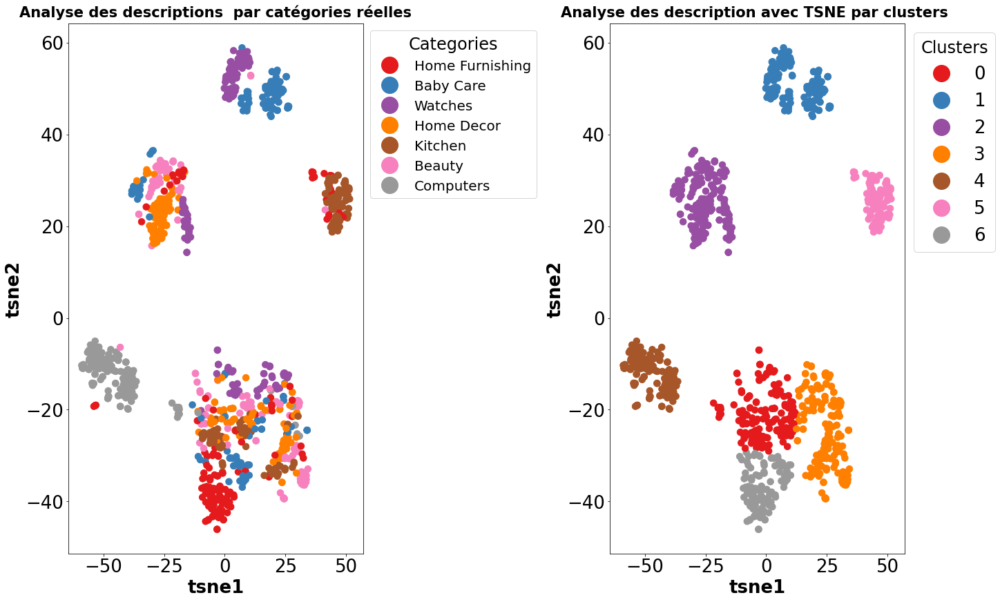

BERT pour HF à un ARI :  0.3083


In [60]:
TSNE_visu_fct(ARI_BERT_HF, X_tsne_BERT_HF, labels_BERT_HF,
                  cible, label_categorie,"BERT", "HF", "BERT_HF")

### b) BERT mode HF

In [39]:
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
model_hub = hub.KerasLayer(model_url, trainable=True)

In [42]:
features_bert_hub, last_hidden_states_tot_hub = feature_BERT(model_hub, model_type, sentences, 
                                                         max_length, b_size, mode='TFhub')

loading configuration file https://huggingface.co/bert-base-uncased/resolve/main/config.json from cache at /home/bdiallo/.cache/huggingface/transformers/3c61d016573b14f7f008c02c4e51a366c67ab274726fe2910691e2a761acf43e.37395cee442ab11005bcd270f3c34464dc1704b715b5d7d52b1a461abe3b9e4e
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.18.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file https://huggingface.co/bert-base-uncased/re

temps traitement :  699.0


In [43]:
 ARI_BERT_TFhub, X_tsne_BERT_TFhub, labels_BERT_TFhub =ARI_fct(features_bert_hub, nombre_cible, label_categorie)

ARI :  0.3029 time :  5.0


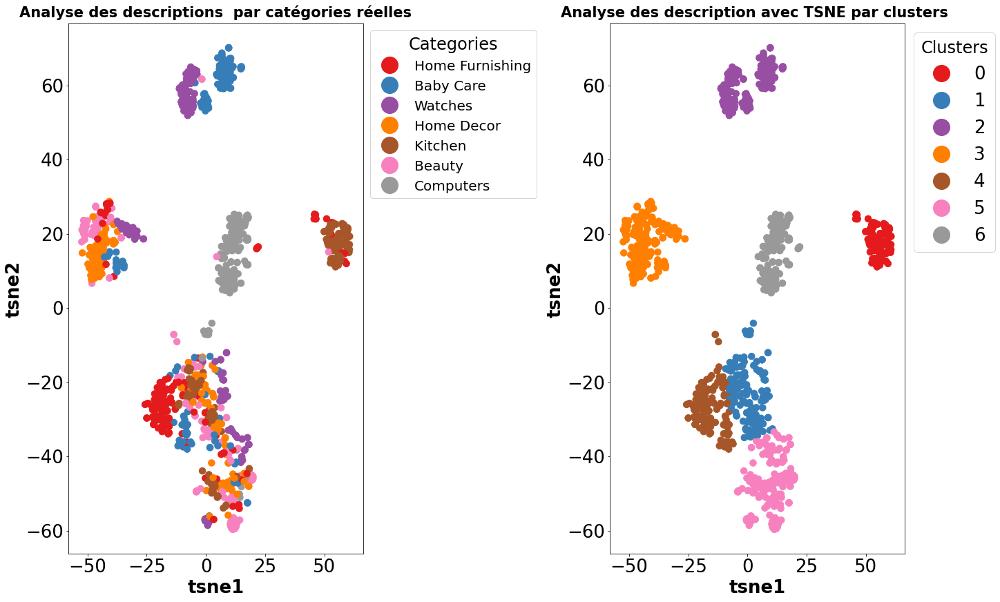

BERT pour TFhub à un ARI :  0.3029


In [46]:
TSNE_visu_fct(ARI_BERT_TFhub, X_tsne_BERT_TFhub, labels_BERT_TFhub,
                  cible, label_categorie,"BERT", "TFhub", "BERT_TFhub")

## USE

In [14]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

2022-04-25 17:43:31.664881: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/bdiallo/miniconda3/lib/python3.8/site-packages/cv2/../../lib64:
2022-04-25 17:43:31.664904: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-04-25 17:43:31.664919: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (bauduc.lmd.jussieu.fr): /proc/driver/nvidia/version does not exist
2022-04-25 17:43:31.665080: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [36]:
features_USE = feature_USE(sentences, b_size)
ARI_USE, X_tsne_USE, labels_USE = ARI_fct(features_USE, nombre_cible, label_categorie)

ARI :  0.4285 time :  5.0


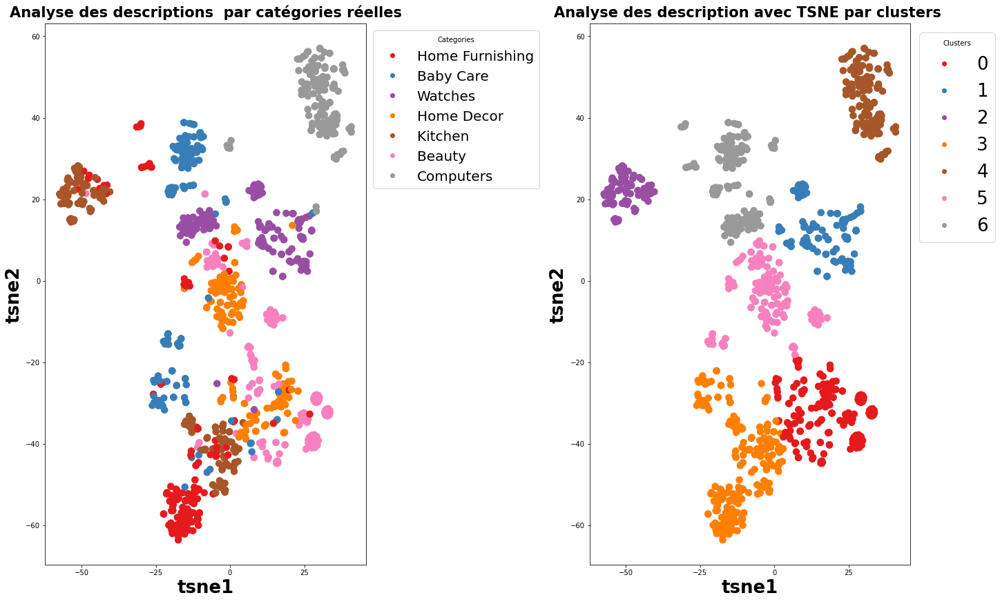

USE pour ut à un ARI :  0.4285


In [37]:
TSNE_visu_fct(ARI_USE, X_tsne_USE, labels_USE,
                  cible, label_categorie,"USE", "ut", "USE")

In [52]:
df_ARI_deeplearning=pd.DataFrame ({'BERT_HF' :  0.3083,
                         'BERT_Thub' : 0.3029,
                         'USE':0.4285
                        },
                        index=["deeplearning"])

In [70]:
df_ARI_total=pd.concat([df_ARI, df_ARI_deeplearning], axis=1)

In [71]:
df_ARI_total["max"]=df_ARI_total.max(axis=1)
df_ARI_total.loc["max",:]=df_ARI_total.max(axis=0)

In [72]:
df_ARI_total

,Word2Vec_1Dpooling,Word2Vec_w2cSimple,Tfidf_cas_1,Tfidf_cas_2,Tfidf_cas_3,CountVect_cas_1,CountVect_cas_2,CountVect_cas_3,BERT_HF,BERT_Thub,USE,max
bow,0.3075,0.1806,0.5755,0.5961,0.4317,0.4110,0.3574,0.3039,NaN,NaN,NaN,0.5961
sansNumberBow,0.3075,0.1980,0.4716,0.5097,0.4486,0.4399,0.3923,0.3590,NaN,NaN,NaN,0.5097
sansCouleurBow,0.3215,0.2021,0.5961,0.5498,0.4109,0.3574,0.3736,0.2995,NaN,NaN,NaN,0.5961
sansNumberCouleurBow,0.3215,0.2025,0.5097,0.4938,0.4473,0.3923,0.4071,0.3790,NaN,NaN,NaN,0.5097
lem,0.2983,0.1982,0.4386,0.5196,0.4560,0.4036,0.4618,0.3264,NaN,NaN,NaN,0.5196
sansNumberLem,0.2983,0.1848,0.4135,0.4364,0.5414,0.4235,0.4305,0.3438,NaN,NaN,NaN,0.5414
sansCouleurLem,0.2919,0.2077,0.5103,0.4313,0.4635,0.4109,0.4144,0.3023,NaN,NaN,NaN,0.5103
sansNumberCouleurLem,0.2919,0.2003,0.4622,0.4156,0.5268,0.4276,0.4343,0.3473,NaN,NaN,NaN,0.5268
deeplearning,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3083,0.3029,0.4285,0.4285
max,0.3215,0.2077,0.5961,0.5961,0.5414,0.4399,0.4618,0.3790,0.3083,0.3029,0.4285,0.5961


In [73]:
df_ARI_total.to_csv('df_ARI_total.csv', encoding='utf-8',index=True)

In [75]:
dd=pd.read_csv('df_ARI_total.csv',index_col=0)
dd

,Word2Vec_1Dpooling,Word2Vec_w2cSimple,Tfidf_cas_1,Tfidf_cas_2,Tfidf_cas_3,CountVect_cas_1,CountVect_cas_2,CountVect_cas_3,BERT_HF,BERT_Thub,USE,max
bow,0.3075,0.1806,0.5755,0.5961,0.4317,0.4110,0.3574,0.3039,NaN,NaN,NaN,0.5961
sansNumberBow,0.3075,0.1980,0.4716,0.5097,0.4486,0.4399,0.3923,0.3590,NaN,NaN,NaN,0.5097
sansCouleurBow,0.3215,0.2021,0.5961,0.5498,0.4109,0.3574,0.3736,0.2995,NaN,NaN,NaN,0.5961
sansNumberCouleurBow,0.3215,0.2025,0.5097,0.4938,0.4473,0.3923,0.4071,0.3790,NaN,NaN,NaN,0.5097
lem,0.2983,0.1982,0.4386,0.5196,0.4560,0.4036,0.4618,0.3264,NaN,NaN,NaN,0.5196
sansNumberLem,0.2983,0.1848,0.4135,0.4364,0.5414,0.4235,0.4305,0.3438,NaN,NaN,NaN,0.5414
sansCouleurLem,0.2919,0.2077,0.5103,0.4313,0.4635,0.4109,0.4144,0.3023,NaN,NaN,NaN,0.5103
sansNumberCouleurLem,0.2919,0.2003,0.4622,0.4156,0.5268,0.4276,0.4343,0.3473,NaN,NaN,NaN,0.5268
deeplearning,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3083,0.3029,0.4285,0.4285
max,0.3215,0.2077,0.5961,0.5961,0.5414,0.4399,0.4618,0.3790,0.3083,0.3029,0.4285,0.5961
